### <b>Install the required libraries</b>

In [1]:
#Install the transformers library (Allows importing models from Hugging Face)
!pip install transformers
!pip install datasets 

### <b>Import necessary libraries</b>

In [2]:
import copy 
import json
import logging 
import os 

import warnings
warnings.filterwarnings("ignore")
import logging
logging.basicConfig(level=logging.ERROR)

import numpy as np
import pandas as pd
from datasets import load_dataset
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch

In [3]:
# Check if CUDA is available
print("CUDA Available:", torch.cuda.is_available())

# If CUDA is available, print the current GPU details
if torch.cuda.is_available():
    print("Current GPU Index:", torch.cuda.current_device())
    print("Current GPU Name:", torch.cuda.get_device_name(torch.cuda.current_device()))
    print("GPU Memory Allocated:", torch.cuda.memory_allocated())
    print("GPU Memory Cached:", torch.cuda.memory_cached())

CUDA Available: True
Current GPU Index: 0
Current GPU Name: GeForce RTX 2080 Ti
GPU Memory Allocated: 0
GPU Memory Cached: 0


### <b>Load the model from Hugging Face's model hub</b>

In [4]:
import transformers
from transformers import AutoConfig, AutoModel, AutoModelForSequenceClassification, AutoTokenizer
from transformers import AdamW, get_linear_schedule_with_warmup

In [5]:
from transformers import AutoModel, AutoTokenizer
from transformers import ElectraForPreTraining, ElectraTokenizer

model_path = "monologg/koelectra-base-v3-discriminator"
model = ElectraForPreTraining.from_pretrained(model_path)
tokenizer = ElectraTokenizer.from_pretrained(model_path)
text = "한국어 KoElectra 모델을 공개합니다!"
encoded_input = tokenizer.encode(text, padding=True, truncation=True, return_tensors='pt')
output = model(encoded_input, output_hidden_states=True)

In [6]:
# Print the values of the final hidden state
print(output[0])

# Print the shape of the final hidden state
print(output[0].shape)

tensor([[-14.8131,  -1.9415,  -1.3572,  -1.9998,  -4.6476,  -4.8606,  -3.1111,
          -2.4952,  -3.3726,  -1.4651,  -3.9084,  -2.5027, -14.8131]],
       grad_fn=<SqueezeBackward1>)
torch.Size([1, 13])


### <b>Set hyperparameters for the experiment</b>

In [7]:
from types import SimpleNamespace

# Create a configuration object to store hyperparameters and other settings
config = SimpleNamespace()

config.task = "koelectra_multi"
config.dataset = "KoMultiText"

config.cache_dir = "koelectra_multi_cache" # Temporary directory for current task assets like vocabulary
config.output_dir = "koelectra_multi_output" # Directory where final models and results will be saved

config.use_tpu = False
config.model_name_or_path = model_path 
config.data_dir = "./" # The input data dir 

config.train_file = "train_dataset.csv" 
config.predict_file = "test_dataset.csv" 

config.max_seq_length = 512 # Maximum sequence length
config.train_batch_size = 8 # Batch size for training
config.eval_batch_size = 4 # Batch size for evaluation

config.learning_rate = 3e-6 # The initial learning rate for Adam
config.num_train_epochs = 10 # Total number of training epochs to perform

config.gradient_accumulation_steps = 4 # Number of updates steps to accumulate before performing a backward/update pass.
config.threads = 4
config.seed = 42 

config.device_num = 0 # Device number (changable for multi-GPU setups)

config.do_train = True 
config.do_eval_during_train = True
config.do_eval = True 

config.do_lower_case = False
config.weight_decay = 0.0 # Weight decay if we apply some.
config.adam_epsilon = 1e-8 # Epsilon for Adam optimizer.
config.max_grad_norm = 1.0 # Max gradient norm.
config.warmup_proportion = 0.0 # Warmup proportion for linear warmup

### <b>Preprocessing the training dataset</b>
* Instead of tokenizing the training text every time, we preprocess and <b>save all tokenized results before starting the model training</b>.
    * This approach significantly speeds up the process.

In [8]:
tokenizer = AutoTokenizer.from_pretrained(config.model_name_or_path, do_lower_case=False, cache_dir=config.cache_dir)

In [9]:
def train_split(config, texts, labels, is_train):
    
    x_train, y_train, x_label, y_label = train_test_split(
        texts, labels, test_size=0.2, random_state=config.seed, stratify=None
    )
    if is_train:
        texts, labels = x_train, x_label
    else:
        texts, labels = y_train, y_label
        
    return texts, labels

def process_comment_cls(config, data_file, is_train):
    
    df = pd.read_csv(data_file)
    df = df[df["preference"]!= -1] # Exclude rows where preference is -1
    
    # Convert columns to lists for processing
    preferences = df["preference"].astype(int).values.tolist()
    profanities = df["profanity"].astype(int).values.tolist()
    genders = df["gender"].astype(int).values.tolist()
    politics = df["politics"].astype(int).values.tolist()
    nations = df["nation"].astype(int).values.tolist()
    races = df["race"].astype(int).values.tolist()
    regions = df["region"].astype(int).values.tolist()
    generations= df["generation"].astype(int).values.tolist()
    social_clss = df["social hierarchy"].astype(int).values.tolist()
    appearances = df["appearance"].astype(int).values.tolist()
    others = df["others"].astype(int).values.tolist()
    
     # Create a combined label list
    labels = []
    for i in range(len(preferences)):
        preference = preferences[i] 
        profanity = profanities[i] 
        gender = genders[i] 
        politic = politics[i] 
        nation = nations[i]
        race = races[i]
        region = regions[i]
        generation = generations[i]
        social_cls = social_clss[i]
        appearance = appearances[i]
        other = others[i]
        labels.append([preference, profanity, gender, politic, nation, race, region, generation, social_cls, appearance, other])
        
    texts = df["comment"].astype(str).values.tolist()
    texts, labels = train_split(config, texts, labels, is_train) # Split the data
    
    return texts, labels

In [10]:
import torch.utils.data as torch_data

def data_pretokenizing(config, tokenizer, is_train=True):
    
    if is_train:
        data_file = config.train_file
    else:
        data_file = config.predict_file

    data_path = config.data_dir
    if data_file is not None:
        data_path = os.path.join(data_path, data_file)
    else:
        data_path += "/"

    # Construct the file name for the tokenized dataset
    comps = [
        data_path,
        config.dataset,
        config.model_name_or_path.replace("/", "_"),
        config.max_seq_length,
        "train" if is_train else "dev",
        "dataset.txt",
    ]
    dataset_file = "_".join([str(comp) for comp in comps])
    print("dataset_file:", dataset_file)

    # Tokenize the dataset and write to the file
    with open(dataset_file, "w", encoding="utf-8") as writer_file:
        cnt = 0
        total_data = process_comment_cls(config, data_path, is_train)
        for text, label in zip(total_data[0], total_data[1]):
            feature = tokenizer(text, max_length=config.max_seq_length, padding="max_length", truncation=True, add_special_tokens=True)
            writed_data = {
                "input_ids": feature["input_ids"],
                "attention_mask": feature["attention_mask"],
                "preference": int(label[0]), 
                "profanity": int(label[1]),
                "gender": int(label[2]),
                "politic": int(label[3]), 
                "nation" : int(label[4]),
                "race" : int(label[5]),
                "region" : int(label[6]),
                "generation" : int(label[7]),
                "social_cls" : int(label[8]),
                "appearance" : int(label[9]),
                "other": int(label[10]),
            }
            writer_file.write(json.dumps(writed_data) + "\n")
            cnt += 1
        print(f"{cnt} features processed from {data_path}")

    return dataset_file

In [11]:
if config.do_train:
    # Preprocess the training dataset
    train_dataset_file = data_pretokenizing(config, tokenizer=tokenizer)

# Preprocess the evaluation dataset (evaluation is equivalent to 'dev' or 'validation')
predict_dataset_file = data_pretokenizing(config, tokenizer=tokenizer, is_train=False)

dataset_file: ./train_dataset.csv_KoMultiText_monologg_koelectra-base-v3-discriminator_512_train_dataset.txt
30688 features processed from ./train_dataset.csv
dataset_file: ./test_dataset.csv_KoMultiText_monologg_koelectra-base-v3-discriminator_512_dev_dataset.txt
400 features processed from ./test_dataset.csv


### <b>Initialize the data loader</b>

In [12]:
class IterableDatasetPad(torch.utils.data.IterableDataset):
    def __init__(
        self,
        dataset: torch.utils.data.IterableDataset,
        batch_size: int = 1,
        num_devices: int = 1,
        seed: int = 0,
    ):
        self.dataset = dataset
        self.batch_size = batch_size
        self.seed = seed
        self.num_examples = 0

        chunk_size = self.batch_size * num_devices
        length = len(dataset)
        self.length = length + (chunk_size - length % chunk_size)

    def __len__(self):
        return self.length

    def __iter__(self):
        self.num_examples = 0
        # If dataset has a set epoch method, set the manual seed for reproducibility
        if (
            not hasattr(self.dataset, "set_epoch")
            and hasattr(self.dataset, "generator")
            and isinstance(self.dataset.generator, torch.Generator)
        ):
            self.dataset.generator.manual_seed(self.seed + self.epoch)

        first_batch = None
        current_batch = []
        for element in self.dataset:
            self.num_examples += 1
            current_batch.append(element)
            # Yield the current batch once it's full
            if len(current_batch) == self.batch_size:
                for batch in current_batch:
                    yield batch
                    if first_batch is None:
                        first_batch = batch.copy()
                current_batch = []
                
        # Pad the last batch if it's smaller than the batch size
        while self.num_examples < self.length:
            add_num = self.batch_size - len(current_batch)
            self.num_examples += add_num
            current_batch += [first_batch] * add_num
            for batch in current_batch:
                yield batch
            current_batch = []

In [13]:
def collate_fn(features):
    
    # Extracting individual features from samples
    input_ids = [sample["input_ids"] for sample in features]
    attention_mask = [sample["attention_mask"] for sample in features]
    
    preference = [sample["preference"] for sample in features]
    profanity = [sample["profanity"] for sample in features]
    gender = [sample["gender"] for sample in features]
    politic = [sample["politic"] for sample in features]
    nation = [sample["nation"] for sample in features]
    race = [sample["race"] for sample in features]
    region = [sample["region"] for sample in features]
    generation = [sample["generation"] for sample in features]
    social_cls = [sample["social_cls"] for sample in features]
    appearance = [sample["appearance"] for sample in features]
    other = [sample["other"] for sample in features]
    
    # Convert lists to tensors
    input_ids = torch.tensor(np.array(input_ids).astype(np.int64), dtype=torch.long)
    attention_mask = torch.tensor(np.array(attention_mask).astype(np.int8), dtype=torch.long)
    
    preference = torch.tensor(np.array(preference).astype(np.int64), dtype=torch.long)
    profanity = torch.tensor(np.array(profanity).astype(np.int64), dtype=torch.float)
    gender = torch.tensor(np.array(gender).astype(np.int64), dtype=torch.float)
    politic = torch.tensor(np.array(politic).astype(np.int64), dtype=torch.float)
    nation = torch.tensor(np.array(nation).astype(np.int64), dtype=torch.float)
    race = torch.tensor(np.array(race).astype(np.int64), dtype=torch.float)
    region = torch.tensor(np.array(region).astype(np.int64), dtype=torch.float)
    generation = torch.tensor(np.array(generation).astype(np.int64), dtype=torch.float)
    social_cls = torch.tensor(np.array(social_cls).astype(np.int64), dtype=torch.float)
    appearance = torch.tensor(np.array(appearance).astype(np.int64), dtype=torch.float)
    other = torch.tensor(np.array(other).astype(np.int64), dtype=torch.float)
    
    inputs = {
        "input_ids": input_ids,
        "attention_mask": attention_mask,
    }
    labels = {
        "preference": preference,
        "profanity": profanity,
        "gender" : gender,
        "politic": politic,
        "nation" :nation, 
        "race" : race,
        "region" : region,
        "generation" : generation,
        "social_cls" : social_cls,
        "appearance" : appearance,
        "other" : other,
    }
    
    return inputs, labels

In [14]:
# If in training mode, prepare training data
if config.do_train:
    
    # Load dataset from file and parse JSON entries
    train_dataset = load_dataset("text", data_files=train_dataset_file, download_mode="force_redownload")["train"]
    train_dataset = train_dataset.map(lambda x: json.loads(x["text"]), batched=False)
    
    # Create data loader for training
    train_dataloader = torch_data.DataLoader(
        train_dataset,
        sampler=torch_data.RandomSampler(train_dataset),
        drop_last=False,
        batch_size=config.train_batch_size,
        collate_fn=(collate_fn),
    )

# Prepare the evaluation (prediction) data
predict_dataset = load_dataset("text", data_files=predict_dataset_file, download_mode="force_redownload")["train"]
predict_dataset = predict_dataset.map(lambda x: json.loads(x["text"]), batched=False)

# Pad the dataset to make it evenly divisible by the batch size
predict_dataset = IterableDatasetPad(
    dataset=predict_dataset,
    batch_size=config.eval_batch_size,
    num_devices=1,
    seed=config.seed,
)

# Create data loader for prediction
predict_dataloader = torch_data.DataLoader(
    predict_dataset,
    sampler=None,
    drop_last=False,
    batch_size=config.eval_batch_size,
    collate_fn=(collate_fn),
)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-63e02828be5fa9dc/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/30688 [00:00<?, ? examples/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-635ae9dfc9bacebc/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/400 [00:00<?, ? examples/s]

### <b>Define the text classification model</b>

In [15]:
from transformers import AutoModel
import torch.nn as nn

class ClsModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        data_file = os.path.join(config.data_dir, str(config.train_file)) 
        model_config = AutoConfig.from_pretrained(config.model_name_or_path, num_labels=5)
        self.model = AutoModel.from_pretrained(
            config.model_name_or_path, config=model_config, cache_dir=config.cache_dir
        )

        # Initialize multiple classifiers (linear layers) for different tasks
        self.classifiers = nn.ModuleList([nn.Linear(768, size) for size in [5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])

        self.tokenizer = tokenizer

    def save_pretrained(self, save_dir):
        self.model.save_pretrained(save_dir)
        # Remove unnecessary keys from the tokenizer's init_kwargs
        for key in ["special_tokens_map_file", "tokenizer_file"]:
            self.tokenizer.init_kwargs.pop(key, None)
        self.tokenizer.save_pretrained(save_dir)

    def get_optimizer(self): 
        # Specify parameters that should not undergo weight decay during training
        no_decay = ["bias", "LayerNorm.weight"]
        # Group model parameters based on whether they should have weight decay or not
        optimizer_grouped_parameters = [
            {
                "params": [p for n, p in self.model.named_parameters() if not any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
            {
                "params": [p for n, p in self.model.named_parameters() if any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
        ]
        
        optimizer = AdamW(optimizer_grouped_parameters, lr=config.learning_rate, eps=config.adam_epsilon)
        return optimizer

    def get_scheduler(self, batch_num, optimizer): 
        # If no warmup is needed, return None
        if config.warmup_proportion == 0.0:
            return None
        
        # Calculate the total number of training steps
        t_total = batch_num // config.gradient_accumulation_steps * config.num_train_epochs
        
        # Define the learning rate scheduler with a linear warmup phase
        scheduler = get_linear_schedule_with_warmup(
            optimizer,
            num_warmup_steps=int(t_total * config.warmup_proportion),
            num_training_steps=t_total,
        )

        return scheduler

    def forward(self, inputs):
        
        hidden = self.model(**inputs) # Get the model's hidden states
        # Extract [CLS] token from the last layer
        cls_token_embeddings = hidden.last_hidden_state[:,0,:]  # [batch_size, 768]
        
        # Get outputs for each task using the respective classifier
        outputs = [classifier(cls_token_embeddings) for classifier in self.classifiers]
        
        return outputs
    
    def eval_step(self, inputs, labels, outputs):
        
        label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
        results = {}
        
        # Process the first output (softmax for multiple classes)
        logits_1 = outputs[0].detach().cpu()
        probabilities = torch.nn.functional.softmax(logits_1, dim=1)
        results["results_1"] = [{"prediction": pred, "label": label, "prob": prob} for pred, label, prob in zip(self.tensor_to_list(torch.argmax(logits_1, dim=-1)), self.tensor_to_list(labels["preference"]), probabilities)]
        
        # Process the other outputs (sigmoid for binary classification)
        for idx, key in enumerate(label_keys[1:], 2):
            logits = outputs[idx-1].detach().cpu()
            threshold = 0.5
            predictions = self.tensor_to_list((torch.sigmoid(logits) > threshold).int())
            results[f"results_{idx}"] = [{"prediction": prediction, "label": label, "prob": torch.sigmoid(prob).item()} for prediction, label, prob in zip(predictions, self.tensor_to_list(labels[key]), logits)]
        
        return results

    def tensor_to_array(self, tensor):
        return tensor.detach().cpu().numpy()
    
    def tensor_to_list(self, tensor):
        return self.tensor_to_array(tensor).tolist()

In [16]:
# Set the random seed for reproducibility in both numpy and PyTorch
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

# Calculate the running average of the loss using a decay factor
def cal_running_avg_loss(loss, running_avg_loss, decay=0.99):
    if running_avg_loss == 0:
        return loss
    running_avg_loss = running_avg_loss * decay + (1 - decay) * loss
    return running_avg_loss

### <b>Define the functions for training and evaluation</b>

In [17]:
from functools import partial
import sklearn.metrics as sklearn_metrics
from sklearn.metrics import mean_absolute_error, f1_score, precision_recall_curve, auc, roc_curve
import matplotlib.pyplot as plt

category_map = {
    1: "preference",
    2: "profanity",
    3: "gender",
    4: "politics",
    5: "nation",
    6: "race",
    7: "region",
    8: "generation",
    9: "social hierarchy",
    10: "appearance",
    11: "others"
}

# Metrics for binary-classification
binary_metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "precision": sklearn_metrics.precision_score,
    "recall": sklearn_metrics.recall_score,
    "f1": sklearn_metrics.f1_score,
    "matthews_corrcoef": sklearn_metrics.matthews_corrcoef,
}

# Metrics for multi-classification
metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "f1-macro": partial(sklearn_metrics.f1_score, average="macro"),
}   

# Function to compute top 2 accuracy. 
# This considers a prediction as correct if the true label is among the top 2 predicted labels.
def top2_accuracy(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)

    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    match = (top_2_indices == torch.tensor(labels).view(-1, 1)).any(dim=1)
    return match.float().mean().item()

# Function to compute top 2 F1 score in a macro-average setting. 
# This treats each class independently then averages the F1 scores.
def top2_f1_macro(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)
    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    labels = np.array(labels)
    
    top_2_pred = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    for i, indices in enumerate(top_2_indices):
        top_2_pred[i, indices] = 1

    y_true = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    y_true[np.arange(len(labels)), labels] = 1
    
    return f1_score(y_true, top_2_pred, average='macro')

# Function to calculate the area under the Precision-Recall curve.
def calculate_pr_auc(labels, prob):
    precision, recall, _ = precision_recall_curve(labels, prob)
    return auc(recall, precision)

# General function to plot either the ROC or Precision-Recall curve for multiple categories.
def plot_curve(labels_list, probs_list, category_names, epoch, curve_type="auroc", dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    for labels, probs, category_name in zip(labels_list, probs_list, category_names):
        if curve_type == "auroc":
            save_path = f"bias_auroc_{epoch}.png" 
            x, y, _ = roc_curve(labels, probs)
            metric = auc(x, y)
            xlabel, ylabel, title = 'False Positive Rate', 'True Positive Rate', 'ROC Curves for Bias Labels'
        else:
            save_path = f"bias_prroc_{epoch}.png"
            x, y, _ = precision_recall_curve(labels, probs)
            metric = auc(y, x)
            xlabel, ylabel, title = 'Recall', 'Precision', 'Precision-Recall Curves for Bias Labels'
        
        plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')

    if curve_type == "auroc":
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.title(title, fontsize=19)
    plt.legend(loc='lower right' if curve_type == "auroc" else 'lower left', fontsize=14)
    plt.tight_layout()
    plt.savefig(save_path, format='png', dpi=dpi)
    plt.show()

# Function dedicated to plot the ROC curve for the profanity category.
def plot_single_roc_curve(labels, probs, category_name, epoch, dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    x, y, _ = roc_curve(labels, probs)
    metric = auc(x, y)
    
    plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curve for Profanity Classification', fontsize=19)
    plt.legend(loc='lower right', fontsize=16)
    plt.tight_layout()
    plt.savefig(f"profanity_auroc_{epoch}.png", format='png', dpi=dpi)
    plt.show()

# Evaluate the performance of the model based on various metrics     
def eval_cls(all_results, all_probs, epoch, **kwargs):
    
    results_dict = {}
    labels_list = []
    probs_list = []
    category_names = []

    for i in range(11):
        results_i = all_results[i]
        probs_i = all_probs[i]
        
        # Extract predictions and ground truth labels for the current category.
        predictions = np.array([result["prediction"] for result in results_i])
        labels = np.array([result["label"] for result in results_i])
        
        # Use binary metrics for binary classification tasks and multi-class metrics for multi-class tasks.
        metric_funcs = binary_metrics if i > 0 else metrics
        # Compute and store each metric.
        results = {metric: round(f(labels, predictions) * 100, 2) for metric, f in metric_funcs.items()}
        
        # If it's a binary task, compute PR and ROC AUC metrics.
        if i > 0:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            results["pr_auc"] = calculate_pr_auc(labels, y_scores)
            results["roc_auc"] = sklearn_metrics.roc_auc_score(labels, y_scores)
            results_dict[f"pr_auc_{i+1}"] = results["pr_auc"]
            results_dict[f"roc_auc{i+1}"] = results["roc_auc"]
        
        # If the task is one of the bias categories, add labels and probabilities to the lists for plotting.
        if i > 1:
            labels_list.append(labels)
            probs = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            probs_list.append(probs)
            category_name = category_map.get(i+1, f"Category {i+1}")
            category_names.append(category_name)
        
         # Special computations for the Preference category.
        if i == 0:  # Preference category
            results_dict["pref_mae"] = mean_absolute_error(labels, predictions)
            results_dict["pref_top2_acc"] = top2_accuracy(labels, probs_i)
            results_dict["pref_top2_f1"] = top2_f1_macro(labels, probs_i)
        
        # If it's the Profanity category, plot the ROC curve.
        if i == 1:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            plot_single_roc_curve(labels, y_scores, category_map[i+1], epoch)

        results_dict[f"results_{i+1}"] = results
        
            
    # Plot the ROC and PRROC curves for all bias tasks (categories from 2 to 11).
    if len(labels_list) > 0:
        plot_curve(labels_list, probs_list, category_names, epoch)
        plot_curve(labels_list, probs_list, category_names,  epoch, curve_type="prroc")

    return results_dict

In [18]:
import torch
import torch.nn as nn
from tqdm import tqdm

def _run_epoch(model, loader, device=None, context=None, **kwargs):
    config = kwargs["config"]
    is_train = kwargs["is_train"]

    avg_loss = 0
    results = []
    batch_num = len(loader)
    
    total_class_counts = [0] * 5 
    correct_class_counts = [0] * 5
    
    # Initialize optimizer and scheduler if in training mode
    optimizer, scheduler = None, None
    if is_train:
        model.train()
        if config.use_tpu:
            optimizer = context.getattr_or("optimizer", lambda: model.get_optimizer())
            scheduler = context.getattr_or("scheduler", lambda: model.get_scheduler(batch_num, optimizer))
        else:
            optimizer = kwargs["optimizer"]
            scheduler = kwargs["scheduler"]
    else:
        model.eval()
    
    # ProgressBar setup
    is_master = True
    pbar = tqdm(enumerate(loader), total=batch_num, disable=not is_master, dynamic_ncols=True, position=0, leave=True)

    corrections = [0] * 11
    total = 0
    
    # Weighting for the class imbalance
    weights = torch.tensor([max([11, 31, 50, 6, 2]) / p for p in [11, 31, 50, 6, 2]]).float().to(device)
    label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
    weights_bias = [1, 10.0, 20.0]
    weights_final = [1, 1, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2]

    for i, (inputs, labels) in pbar:
        # Move tensors to device
        inputs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in inputs.items()}
        labels = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in labels.items()}

        outputs = model(inputs)

        # First loss: preference 
        loss_function_1 = nn.CrossEntropyLoss(weight=weights)
        loss_1 = loss_function_1(outputs[0], labels["preference"])
        predicted1 = torch.argmax(outputs[0], dim=1)
        corrections[0] += predicted1.eq(labels["preference"]).sum().item()
        for j in range(5):  
            mask = (labels["preference"] == j)
            correct_class_counts[j] += predicted1[mask].eq(labels["preference"][mask]).sum().item()
            total_class_counts[j] += mask.sum().item()

        # Subsequent losses
        total_losses = [loss_1]
        threshold, threshold2 = 0.5, 0.40
        for idx, key in enumerate(label_keys[1:], 2):
            if key == "profanity":
                loss_fn = nn.BCEWithLogitsLoss()
            else:
                weight_value = weights_bias[1 if key == "gender" else 2]
                loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight_value]).to(device))
            
            loss = loss_fn(outputs[idx-1].squeeze(1), labels[key])
            total_losses.append(loss)
            predicted = torch.sigmoid(outputs[idx-1].squeeze(1)) >= (threshold if key == "profanity" else threshold2)
            corrections[idx-1] += predicted.eq(labels[key]).sum().item()

        # Compute the total loss using the individual weights
        total_loss = sum(w * l for w, l in zip(weights_final, total_losses))
        avg_loss = cal_running_avg_loss(total_loss.item(), avg_loss)
        total_loss /= config.gradient_accumulation_steps

        if is_train:
            total_loss.backward()
            if i % config.gradient_accumulation_steps == 0 or i == batch_num - 1:
                if config.max_grad_norm > 0:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), config.max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()
                if scheduler is not None:
                    scheduler.step()
        else:
            result = (model.module if hasattr(model, "module") else model).eval_step(inputs, labels, outputs)
            results.append(result)
        
        # Update progress bar
        if is_master:
            pbar.set_description(f"epoch: {kwargs['epoch'] + 1}, {('train' if is_train else 'valid')} loss: {min(100, round(avg_loss, 4))}")
            
    class_accuracies = [correct / total if total != 0 else 0 for correct, total in zip(correct_class_counts, total_class_counts)]
    
    print("Preference Accuracy per class")
    for i, acc in enumerate(class_accuracies):
        print(f"Class {i+1}: {acc*100:.2f}%")
        
    return {"loss": avg_loss, "result": results}

# Wrapper to run the epoch either on CPU/GPU or TPUs
def run_epoch(**kwargs):
    model = kwargs.pop("model")
    if kwargs["config"].use_tpu:
        results = model(_run_epoch, **kwargs)
    else:
        results = _run_epoch(model, **kwargs)

    if isinstance(results, list):
        loss = sum([result["loss"] for result in results]) / len(results)
        result = [res["result"] for res in results]
        results = {"loss": loss, "result": result}

    return results

### <b>Model Initialization and Configuration</b>

In [19]:
import os
import torch

set_seed(config.seed) # Set the random seed for reproducibility

model = ClsModel() # Initialize the classification model
print(f"Configuration: {str(config)}")

# Check for available GPUs and set the model to run on GPU(s) if available
if torch.cuda.is_available():
    gpu_count = torch.cuda.device_count()
    print(f"{gpu_count} GPU device(s) detected")
    device_num = config.device_num
    devices = [device_num]
    # Use Data Parallelism if more than one GPU is available
    model_dp = torch.nn.DataParallel(model, device_ids=devices)
    model_dp.to(devices[0])  
else:
    devices = ["cpu"] # If no GPUs are available, use the CPU
    model_dp = model

# Create cache directory if it doesn't exist
if not os.path.exists(config.cache_dir):
    os.makedirs(config.cache_dir)

# Define and create the output directory
output_dir = os.path.join(config.output_dir, config.task, config.dataset)
print("Output directory:", output_dir)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize optimizer and scheduler if in training mode
optimizer = None
scheduler = None
if config.do_train:
    optimizer = model.get_optimizer()
    scheduler = model.get_scheduler(len(train_dataloader), optimizer)

# Bundle parameters for easy reference
params = {
    "config": config,
    "model": model_dp,
    "optimizer": optimizer,
    "scheduler": scheduler,
}
if not config.use_tpu:
    params["device"] = devices[0]

Configuration: namespace(task='koelectra_multi', dataset='KoMultiText', cache_dir='koelectra_multi_cache', output_dir='koelectra_multi_output', use_tpu=False, model_name_or_path='monologg/koelectra-base-v3-discriminator', data_dir='./', train_file='train_dataset.csv', predict_file='test_dataset.csv', max_seq_length=512, train_batch_size=8, eval_batch_size=4, learning_rate=3e-06, num_train_epochs=20, gradient_accumulation_steps=4, threads=4, seed=42, device_num=0, do_train=True, do_eval_during_train=True, do_eval=True, do_lower_case=False, weight_decay=0.0, adam_epsilon=1e-08, max_grad_norm=1.0, warmup_proportion=0.0)
4 GPU device(s) detected
Output directory: koelectra_multi_output/koelectra_multi/KoMultiText


### <b>Traning the model</b>

In [20]:
import os
import json
import copy
import torch

def do_eval(epoch):
    # No gradient computation during evaluation
    with torch.no_grad():
        # Run one epoch without training (inference only)
        results = run_epoch(loader=predict_dataloader, epoch=epoch, is_train=False, **params)["result"]
        
        # Group results by category
        all_results = [ [result_dict[f'results_{i}'] for result_dict in results] for i in range(1, 12) ]
        all_results = [ [item for sublist in result_list for item in sublist] for result_list in all_results ]
        
        # Extract probabilities from results
        probs = [ [result['prob'] for result in results] for results in all_results ]
        all_probs = []
        for p in probs:
            tensors = []
            for t in p:
                if isinstance(t, torch.Tensor):
                    tensors.append(t.view(1, -1))
                else:
                    tensors.append(torch.tensor([[t]]))
            all_probs.append(torch.cat(tensors))
        
        # Evaluate the model using the evaluation data
        eval_results = eval_cls(
            config=config,
            model=model,
            loader=predict_dataloader,
            tokenizer=model.tokenizer,
            all_results=all_results,
            all_probs=all_probs,
            epoch=epoch
        )
        
        category_labels = {
            1: "Preference",
            2: "Slang",
            3: "Gender",
            4: "Politic",
            5: "Nation",
            6: "Race",
            7: "Region",
            8: "Generation",
            9: "Social Class",
            10: "Appearance",
            11: "Other",
        }
        
        # Print evaluation results by category
        for i in range(1, 12):
            label_name = category_labels.get(i, f"Category {i}")
            print(f"\nEval results for {label_name}.")
            for k, v in eval_results[f"results_{i}"].items():
                print(f"{k} : {v}")
            if i == 1:
                print(f"preference_mae:{eval_results['pref_mae']}")
                print(f"preference_top2_accuracy:{eval_results['pref_top2_acc']}")
                print(f"preference_top2_f1:{eval_results['pref_top2_f1']}")
            
    return [eval_results[f"results_{i}"] for i in range(1, 12)] + [eval_results["pref_mae"], eval_results["pref_top2_acc"], eval_results["pref_top2_f1"]] + [eval_results[f"pr_auc_{i+1}"] for i in range(1, 11)]

epoch: 1, train loss: 14.3133: 100%|█████████████████████████████████████| 3836/3836 [22:38<00:00,  2.82it/s]


Preference Accuracy per class
Class 1: 25.29%
Class 2: 46.71%
Class 3: 51.12%
Class 4: 4.15%
Class 5: 1.27%


epoch: 1, valid loss: 19.0723: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 12.63it/s]


Preference Accuracy per class
Class 1: 53.66%
Class 2: 33.33%
Class 3: 81.19%
Class 4: 0.00%
Class 5: 0.00%


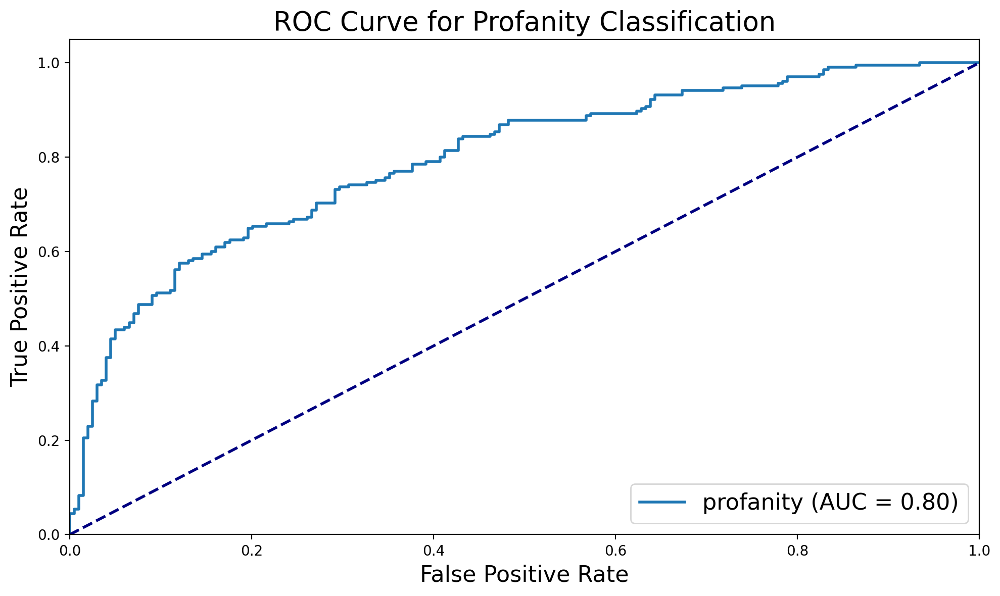

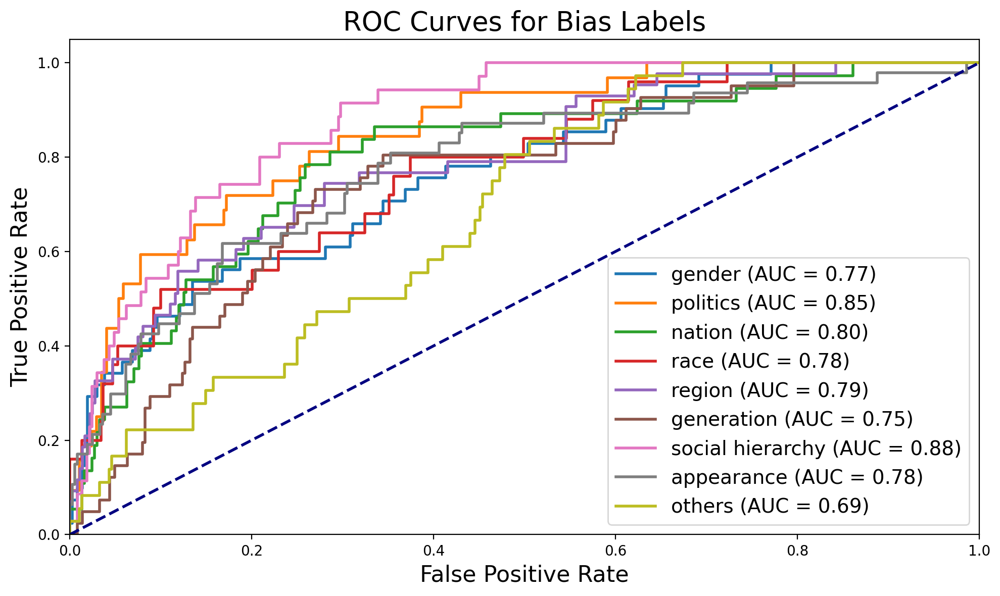

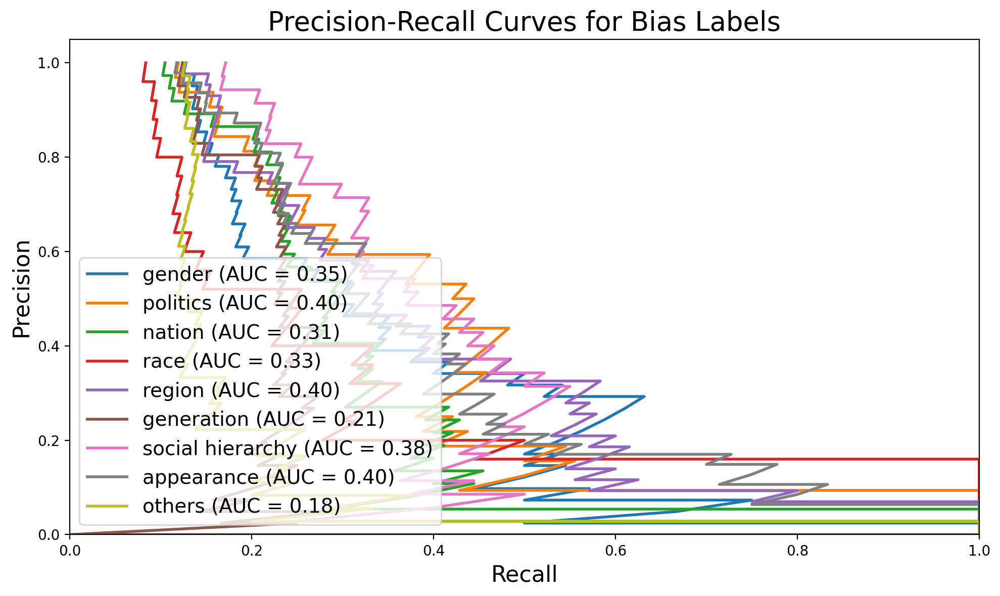


Eval results for Preference.
accuracy : 37.62
f1-macro : 27.15
preference_mae:0.8985148514851485
preference_top2_accuracy:0.6287128925323486
preference_top2_f1:0.3598216230858795

Eval results for Slang.
accuracy : 70.3
precision : 84.0
recall : 51.22
f1 : 63.64
matthews_corrcoef : 44.53
pr_auc : 0.8033570091732422
roc_auc : 0.7958573354577767

Eval results for Gender.
accuracy : 70.3
precision : 19.38
recall : 60.98
f1 : 29.41
matthews_corrcoef : 20.94
pr_auc : 0.3473207207465199
roc_auc : 0.7658402203856749

Eval results for Politic.
accuracy : 66.83
precision : 17.31
recall : 84.38
f1 : 28.72
matthews_corrcoef : 27.57
pr_auc : 0.3954429148139816
roc_auc : 0.8529065860215054

Eval results for Nation.
accuracy : 73.76
precision : 22.83
recall : 78.38
f1 : 35.37
matthews_corrcoef : 32.11
pr_auc : 0.31308661582337505
roc_auc : 0.7971131894837616

Eval results for Race.
accuracy : 67.82
precision : 11.68
recall : 64.0
f1 : 19.75
matthews_corrcoef : 16.32
pr_auc : 0.3264063866151706
roc_

epoch: 2, train loss: 12.6859: 100%|█████████████████████████████████████| 3836/3836 [23:48<00:00,  2.69it/s]


Preference Accuracy per class
Class 1: 52.71%
Class 2: 38.52%
Class 3: 75.20%
Class 4: 5.41%
Class 5: 0.00%


epoch: 2, valid loss: 16.0512: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 13.56it/s]


Preference Accuracy per class
Class 1: 75.61%
Class 2: 39.74%
Class 3: 65.35%
Class 4: 11.59%
Class 5: 0.00%


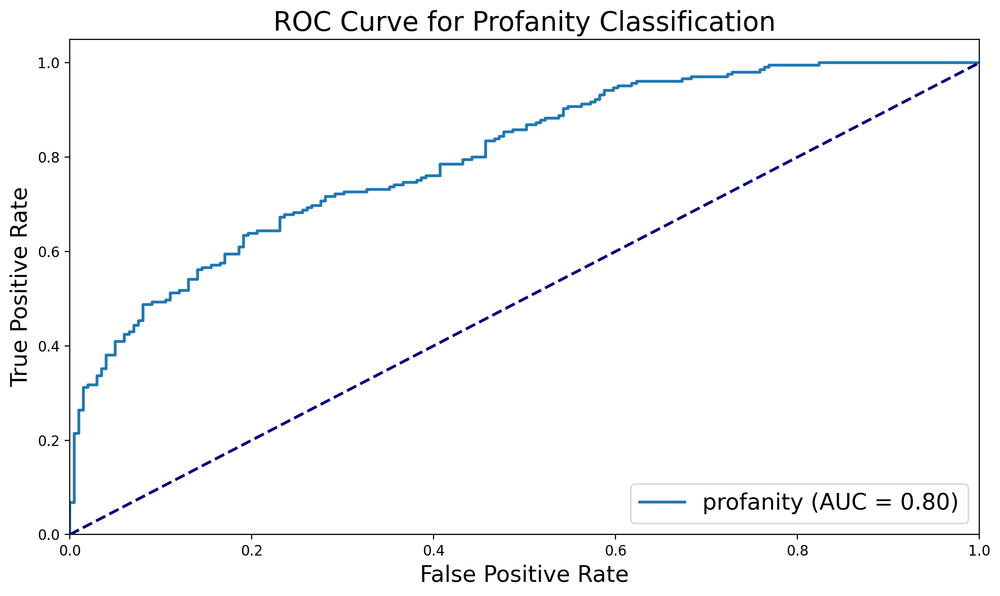

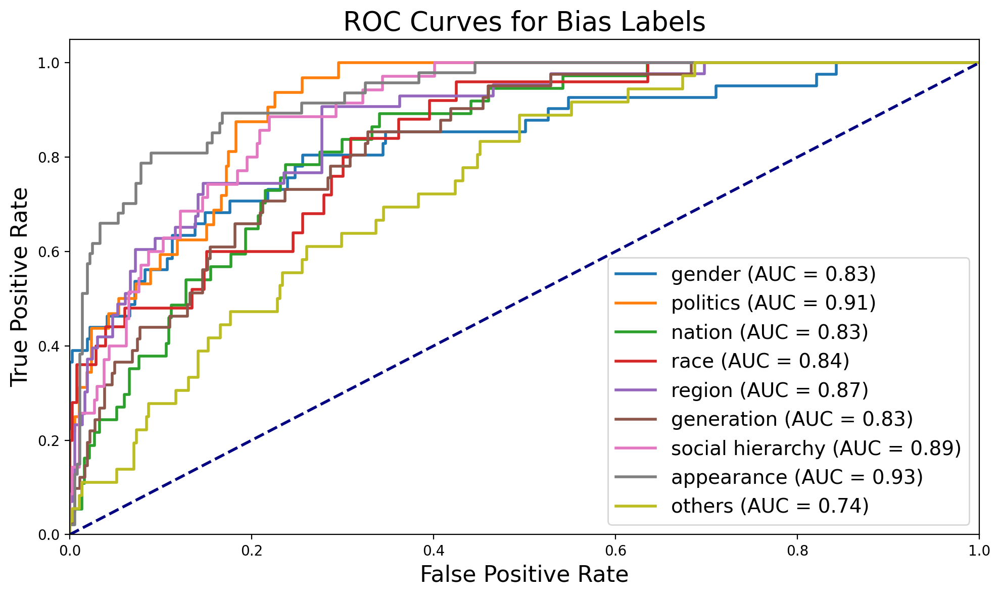

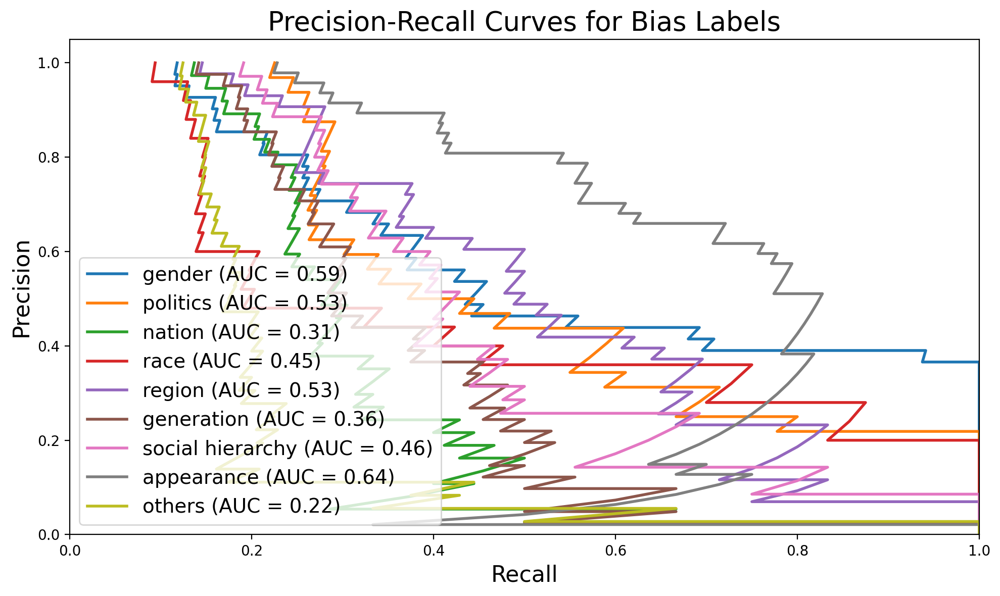


Eval results for Preference.
accuracy : 41.34
f1-macro : 33.53
preference_mae:0.8465346534653465
preference_top2_accuracy:0.6658415794372559
preference_top2_f1:0.3915621721428402

Eval results for Slang.
accuracy : 70.3
precision : 78.91
recall : 56.59
f1 : 65.91
matthews_corrcoef : 42.61
pr_auc : 0.81633212593592
roc_auc : 0.8008089226620909

Eval results for Gender.
accuracy : 70.3
precision : 22.76
recall : 80.49
f1 : 35.48
matthews_corrcoef : 31.25
pr_auc : 0.5877284934910382
roc_auc : 0.8347107438016528

Eval results for Politic.
accuracy : 76.24
precision : 24.6
recall : 96.88
f1 : 39.24
matthews_corrcoef : 41.59
pr_auc : 0.5304155321193199
roc_auc : 0.9078461021505376

Eval results for Nation.
accuracy : 75.0
precision : 23.77
recall : 78.38
f1 : 36.48
matthews_corrcoef : 33.32
pr_auc : 0.31356015718258
roc_auc : 0.829663450916857

Eval results for Race.
accuracy : 69.8
precision : 14.6
recall : 80.0
f1 : 24.69
matthews_corrcoef : 25.0
pr_auc : 0.45283919966041536
roc_auc : 0.8

epoch: 3, train loss: 10.7513: 100%|█████████████████████████████████████| 3836/3836 [24:02<00:00,  2.66it/s]


Preference Accuracy per class
Class 1: 60.86%
Class 2: 35.85%
Class 3: 75.59%
Class 4: 18.20%
Class 5: 3.27%


epoch: 3, valid loss: 13.2032: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 12.95it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 39.74%
Class 3: 62.38%
Class 4: 17.39%
Class 5: 0.00%


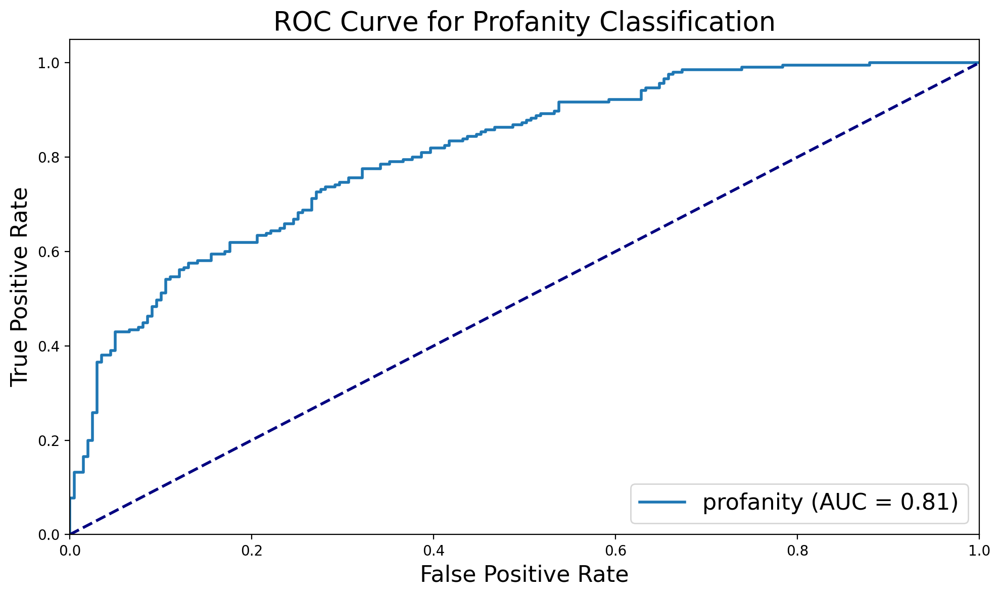

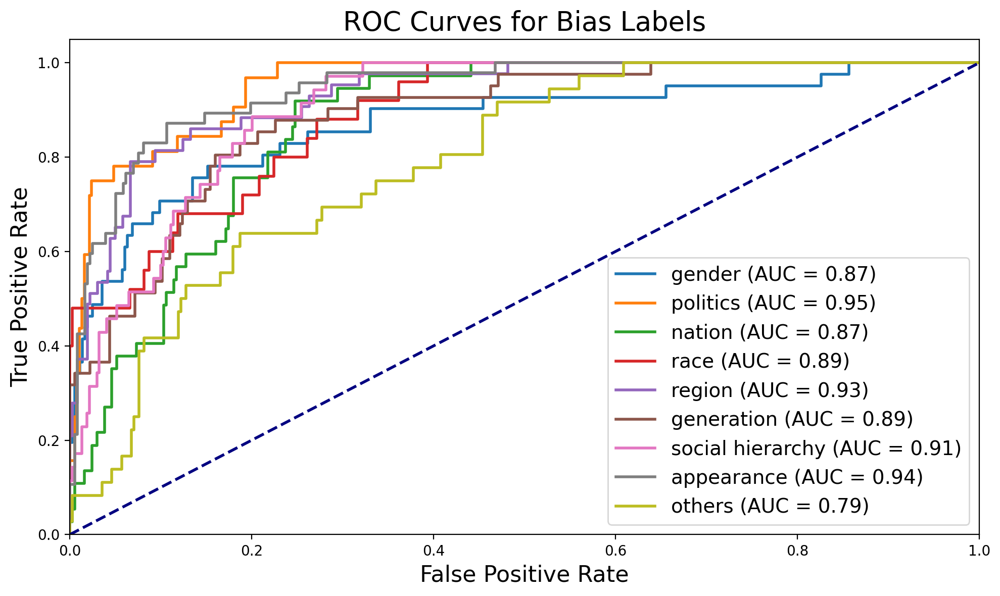

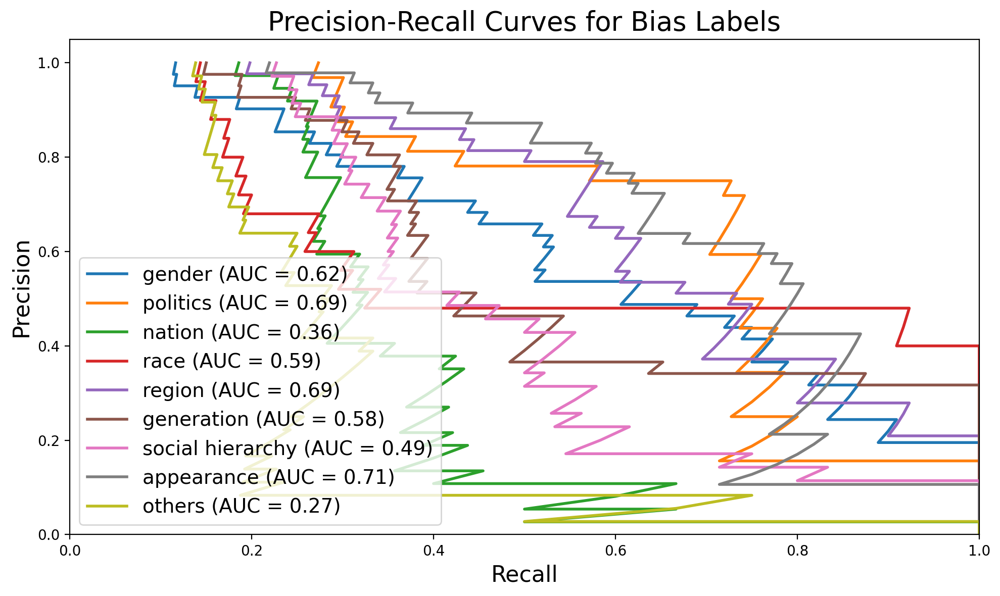


Eval results for Preference.
accuracy : 42.57
f1-macro : 35.62
preference_mae:0.7722772277227723
preference_top2_accuracy:0.7376237511634827
preference_top2_f1:0.48631634357157794

Eval results for Slang.
accuracy : 71.04
precision : 79.33
recall : 58.05
f1 : 67.04
matthews_corrcoef : 43.95
pr_auc : 0.8140480812648624
roc_auc : 0.8088246108591739

Eval results for Gender.
accuracy : 72.28
precision : 24.82
recall : 85.37
f1 : 38.46
matthews_corrcoef : 35.58
pr_auc : 0.6183544235452783
roc_auc : 0.8711281327689311

Eval results for Politic.
accuracy : 81.93
precision : 30.1
recall : 96.88
f1 : 45.93
matthews_corrcoef : 48.04
pr_auc : 0.6883007495101798
roc_auc : 0.9537970430107526

Eval results for Nation.
accuracy : 77.97
precision : 26.79
recall : 81.08
f1 : 40.27
matthews_corrcoef : 37.85
pr_auc : 0.35819722509779417
roc_auc : 0.8715663892775609

Eval results for Race.
accuracy : 73.51
precision : 17.46
recall : 88.0
f1 : 29.14
matthews_corrcoef : 31.5
pr_auc : 0.5867640883523995
ro

epoch: 4, train loss: 10.0617: 100%|█████████████████████████████████████| 3836/3836 [24:19<00:00,  2.63it/s]


Preference Accuracy per class
Class 1: 61.94%
Class 2: 34.34%
Class 3: 75.88%
Class 4: 22.29%
Class 5: 11.45%


epoch: 4, valid loss: 11.5592: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 13.29it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 37.18%
Class 3: 59.41%
Class 4: 20.29%
Class 5: 20.27%


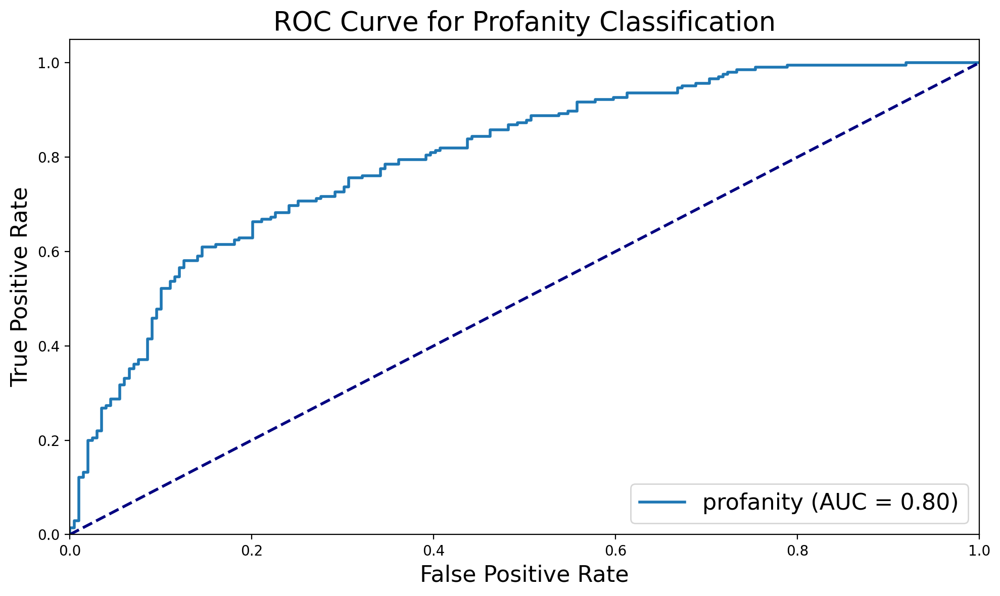

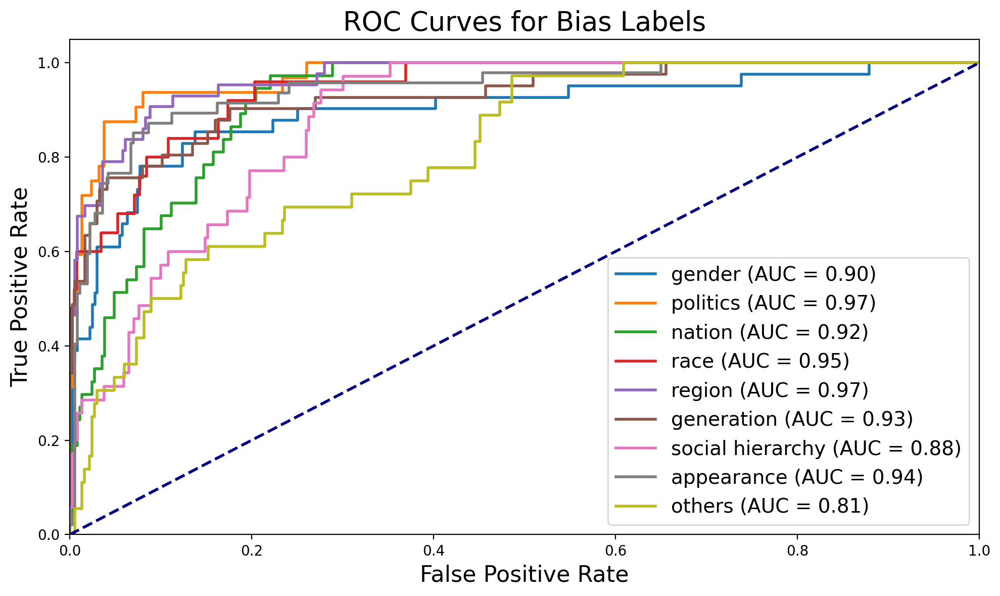

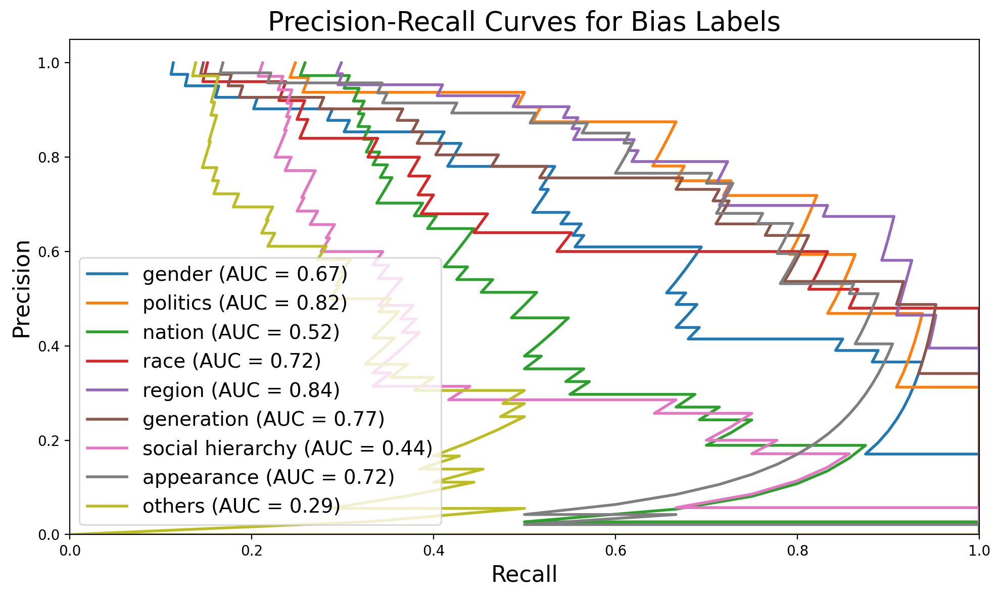


Eval results for Preference.
accuracy : 45.79
f1-macro : 41.85
preference_mae:0.7747524752475248
preference_top2_accuracy:0.7301980257034302
preference_top2_f1:0.4888533972964848

Eval results for Slang.
accuracy : 72.52
precision : 76.11
recall : 66.83
f1 : 71.17
matthews_corrcoef : 45.49
pr_auc : 0.786845487969114
roc_auc : 0.7997548719205785

Eval results for Gender.
accuracy : 83.42
precision : 36.46
recall : 85.37
f1 : 51.09
matthews_corrcoef : 48.64
pr_auc : 0.674598789648906
roc_auc : 0.8984747698716656

Eval results for Politic.
accuracy : 83.17
precision : 31.25
recall : 93.75
f1 : 46.88
matthews_corrcoef : 48.23
pr_auc : 0.8163193545797681
roc_auc : 0.9713541666666666

Eval results for Nation.
accuracy : 79.46
precision : 30.17
recall : 94.59
f1 : 45.75
matthews_corrcoef : 46.24
pr_auc : 0.517071764046638
roc_auc : 0.9195817070476471

Eval results for Race.
accuracy : 76.73
precision : 20.51
recall : 96.0
f1 : 33.8
matthews_corrcoef : 37.96
pr_auc : 0.7157157357824001
roc_au

epoch: 5, train loss: 9.1052: 100%|██████████████████████████████████████| 3836/3836 [24:38<00:00,  2.59it/s]


Preference Accuracy per class
Class 1: 63.05%
Class 2: 34.01%
Class 3: 76.04%
Class 4: 20.68%
Class 5: 19.09%


epoch: 5, valid loss: 11.0317: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 12.93it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 35.90%
Class 3: 65.35%
Class 4: 21.74%
Class 5: 39.19%


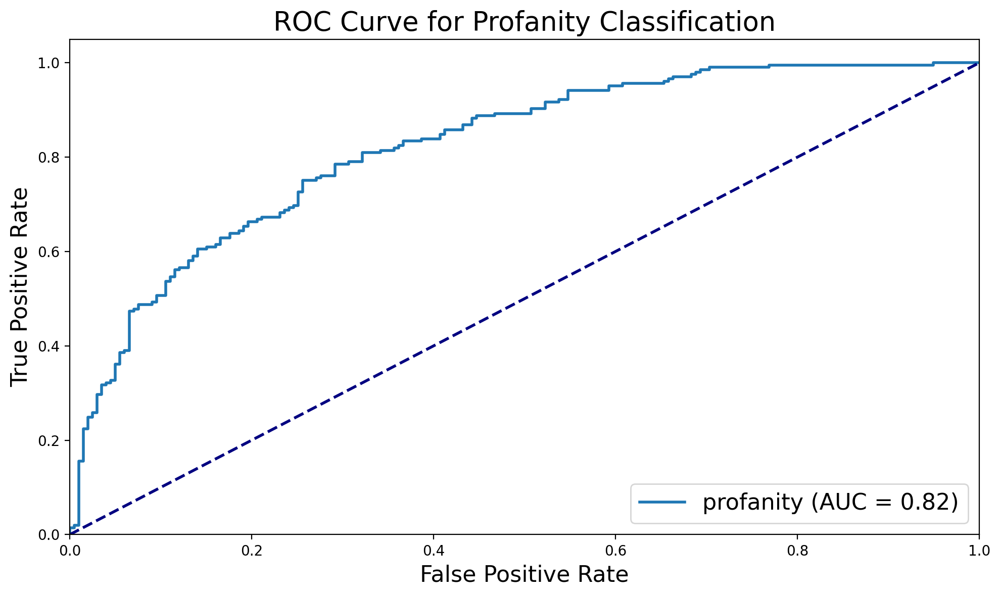

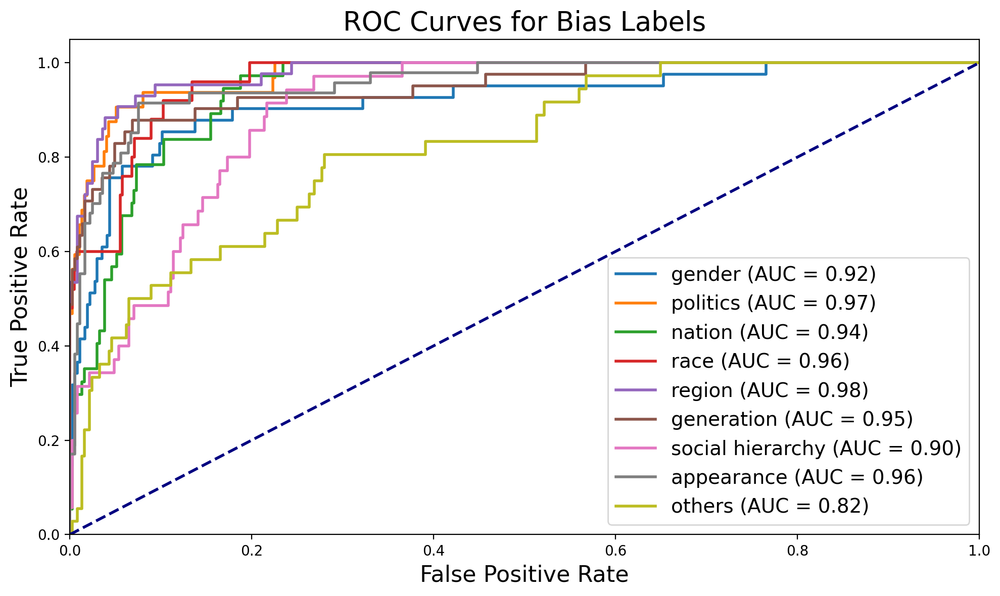

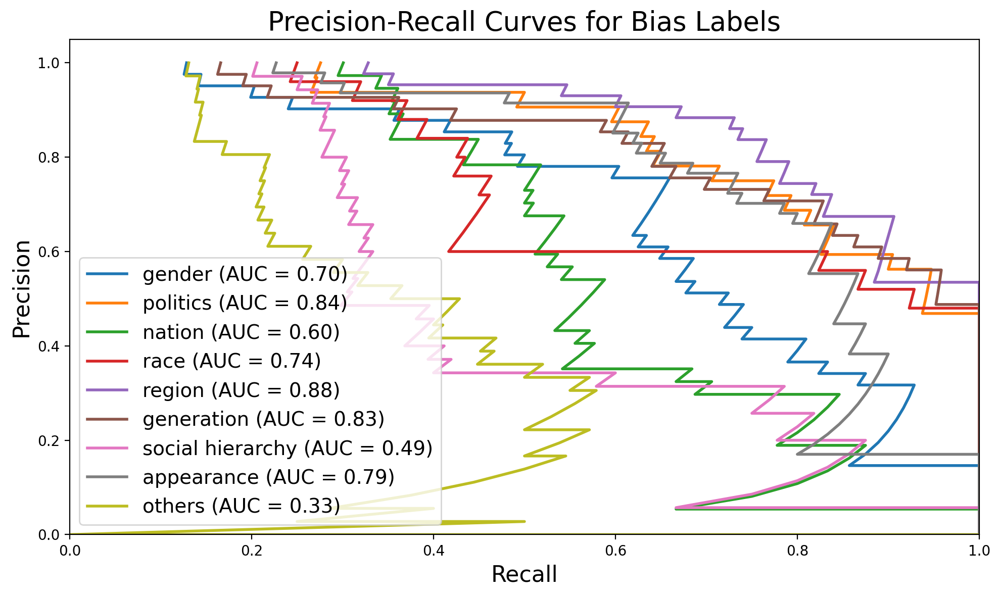


Eval results for Preference.
accuracy : 50.5
f1-macro : 47.62
preference_mae:0.6806930693069307
preference_top2_accuracy:0.8069307208061218
preference_top2_f1:0.5485958176373998

Eval results for Slang.
accuracy : 72.52
precision : 79.38
recall : 61.95
f1 : 69.59
matthews_corrcoef : 46.38
pr_auc : 0.8092157321478163
roc_auc : 0.8218409118764555

Eval results for Gender.
accuracy : 86.88
precision : 42.68
recall : 85.37
f1 : 56.91
matthews_corrcoef : 54.37
pr_auc : 0.6974770440885789
roc_auc : 0.9183632332191091

Eval results for Politic.
accuracy : 89.85
precision : 43.48
recall : 93.75
f1 : 59.41
matthews_corrcoef : 59.75
pr_auc : 0.8447274885020115
roc_auc : 0.974630376344086

Eval results for Nation.
accuracy : 84.41
precision : 35.23
recall : 83.78
f1 : 49.6
matthews_corrcoef : 47.69
pr_auc : 0.6004497198784107
roc_auc : 0.9421165034244053

Eval results for Race.
accuracy : 82.92
precision : 26.09
recall : 96.0
f1 : 41.03
matthews_corrcoef : 44.85
pr_auc : 0.7430193967219387
roc_a

epoch: 6, train loss: 8.4636: 100%|██████████████████████████████████████| 3836/3836 [24:28<00:00,  2.61it/s]


Preference Accuracy per class
Class 1: 64.40%
Class 2: 35.12%
Class 3: 75.65%
Class 4: 23.44%
Class 5: 30.18%


epoch: 6, valid loss: 10.6528: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 13.22it/s]


Preference Accuracy per class
Class 1: 74.39%
Class 2: 48.72%
Class 3: 66.34%
Class 4: 21.74%
Class 5: 27.03%


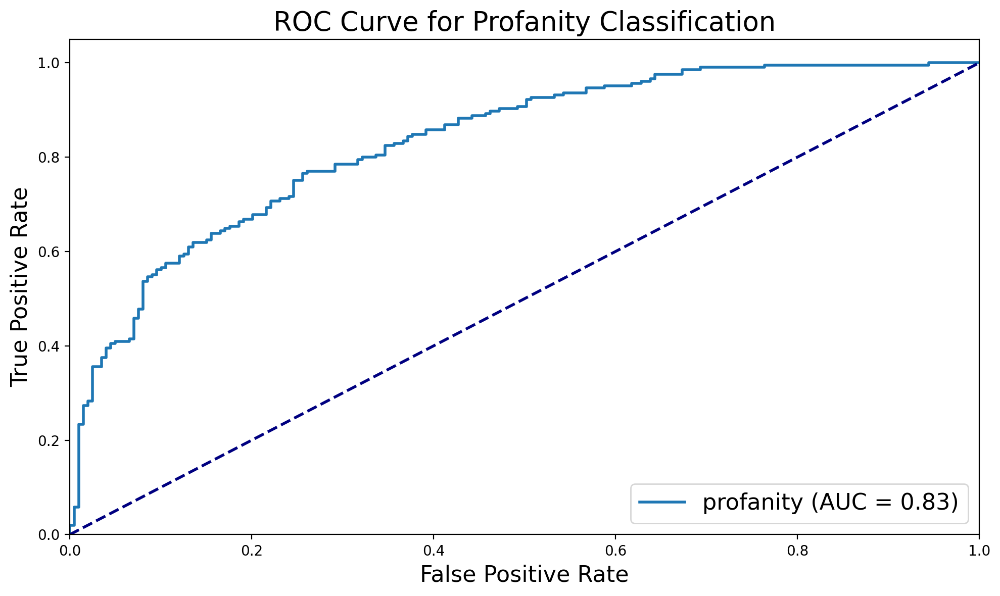

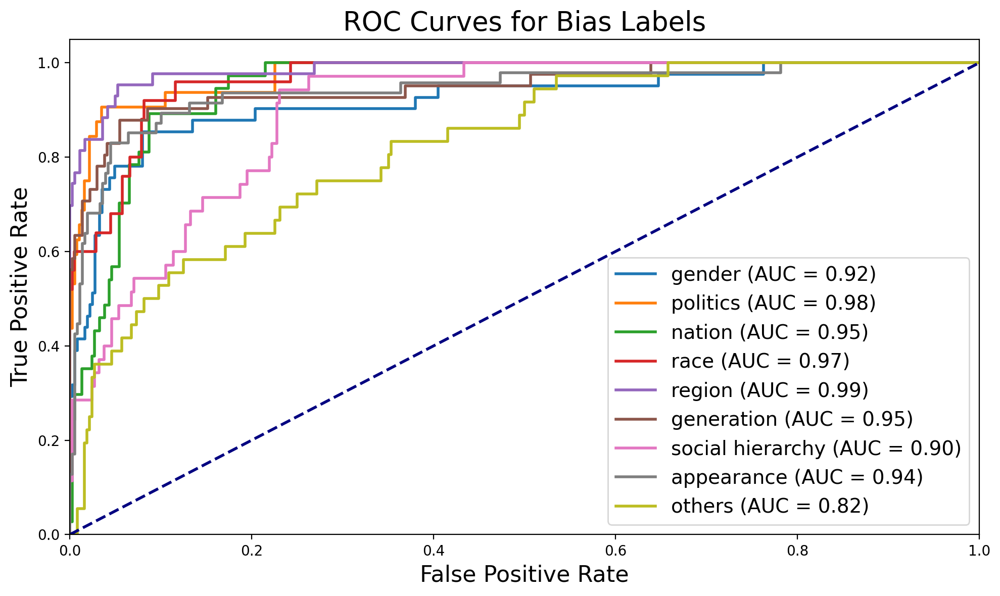

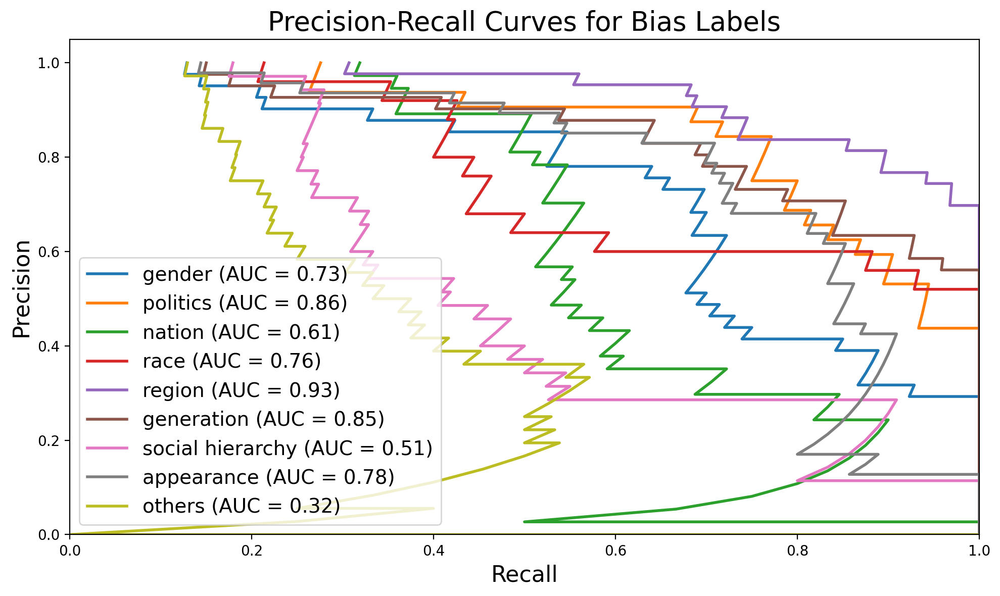


Eval results for Preference.
accuracy : 49.75
f1-macro : 46.73
preference_mae:0.6633663366336634
preference_top2_accuracy:0.7995049357414246
preference_top2_f1:0.543966225295629

Eval results for Slang.
accuracy : 73.51
precision : 81.01
recall : 62.44
f1 : 70.52
matthews_corrcoef : 48.52
pr_auc : 0.8283244326448038
roc_auc : 0.8329697266821914

Eval results for Gender.
accuracy : 89.36
precision : 48.61
recall : 85.37
f1 : 61.95
matthews_corrcoef : 59.32
pr_auc : 0.7291064693840028
roc_auc : 0.920647718873883

Eval results for Politic.
accuracy : 91.58
precision : 48.33
recall : 90.62
f1 : 63.04
matthews_corrcoef : 62.5
pr_auc : 0.8553572841428141
roc_auc : 0.9759744623655914

Eval results for Nation.
accuracy : 87.62
precision : 41.77
recall : 89.19
f1 : 56.9
matthews_corrcoef : 55.75
pr_auc : 0.6139791100910654
roc_auc : 0.9497017453420723

Eval results for Race.
accuracy : 88.12
precision : 33.8
recall : 96.0
f1 : 50.0
matthews_corrcoef : 52.92
pr_auc : 0.7610723935620297
roc_auc 

epoch: 7, train loss: 8.1871: 100%|██████████████████████████████████████| 3836/3836 [24:29<00:00,  2.61it/s]


Preference Accuracy per class
Class 1: 64.43%
Class 2: 38.65%
Class 3: 75.41%
Class 4: 25.00%
Class 5: 28.73%


epoch: 7, valid loss: 10.6789: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 13.00it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 41.03%
Class 3: 63.37%
Class 4: 24.64%
Class 5: 33.78%


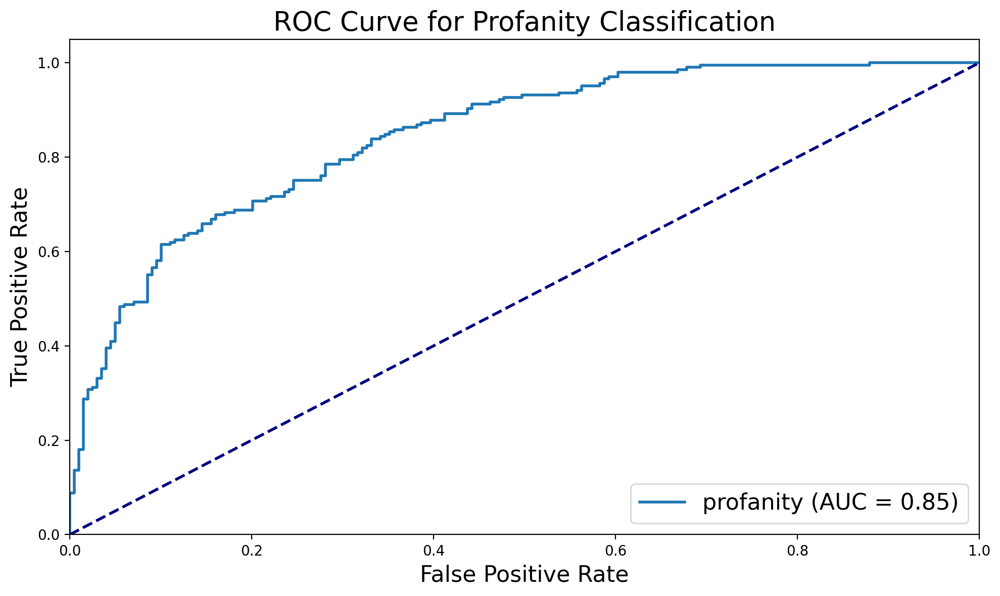

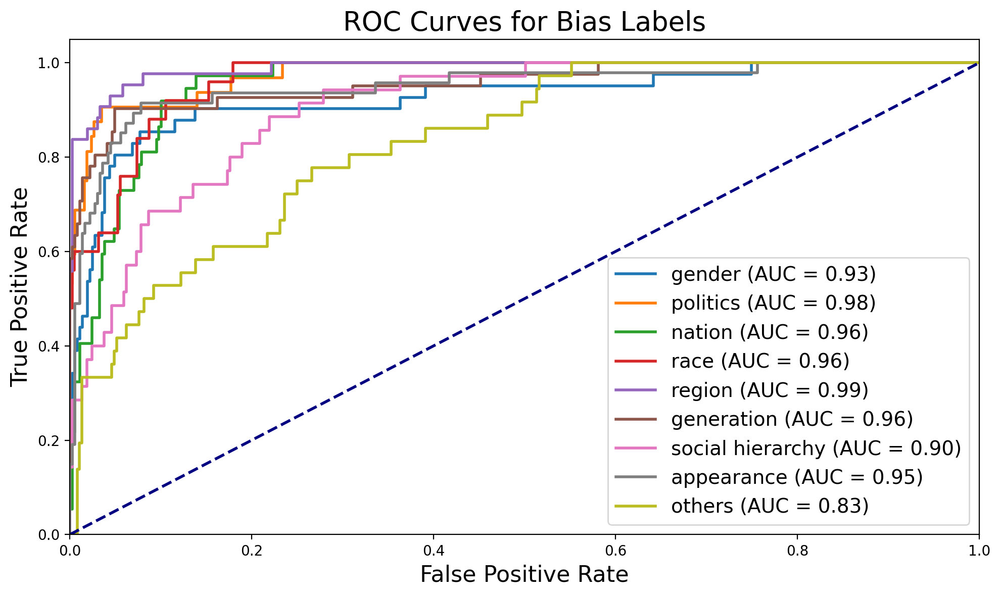

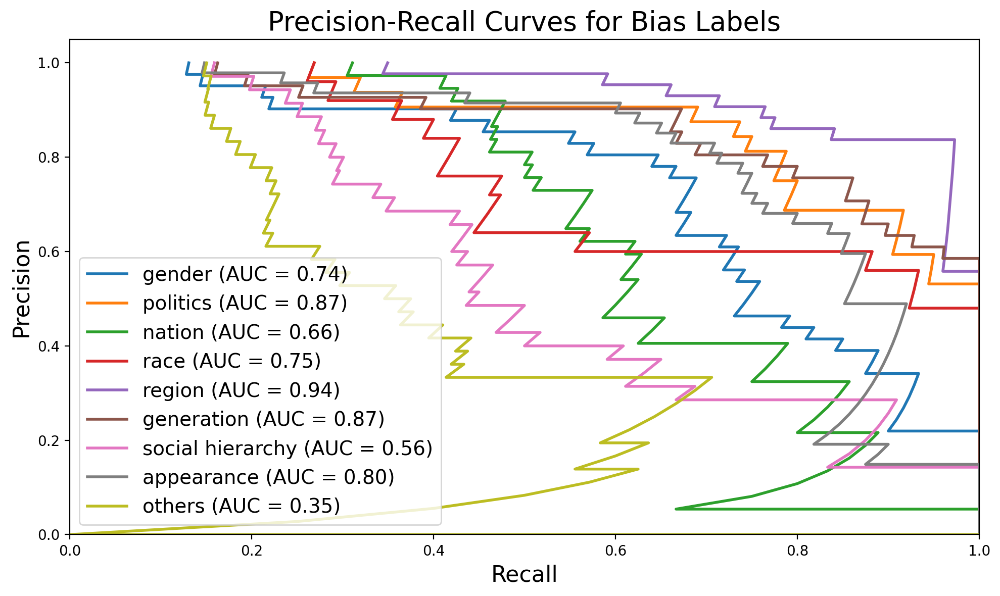


Eval results for Preference.
accuracy : 50.74
f1-macro : 48.03
preference_mae:0.6584158415841584
preference_top2_accuracy:0.7970296740531921
preference_top2_f1:0.5433085468797119

Eval results for Slang.
accuracy : 75.25
precision : 80.35
recall : 67.8
f1 : 73.54
matthews_corrcoef : 51.24
pr_auc : 0.8465899894727926
roc_auc : 0.8456428483882829

Eval results for Gender.
accuracy : 89.85
precision : 50.0
recall : 85.37
f1 : 63.06
matthews_corrcoef : 60.42
pr_auc : 0.7403693279640338
roc_auc : 0.9258214069744004

Eval results for Politic.
accuracy : 91.09
precision : 46.77
recall : 90.62
f1 : 61.7
matthews_corrcoef : 61.26
pr_auc : 0.8714342117968878
roc_auc : 0.9772345430107526

Eval results for Nation.
accuracy : 89.85
precision : 47.22
recall : 91.89
f1 : 62.39
matthews_corrcoef : 61.45
pr_auc : 0.6558701340893793
roc_auc : 0.955372265998969

Eval results for Race.
accuracy : 85.64
precision : 29.11
recall : 92.0
f1 : 44.23
matthews_corrcoef : 46.91
pr_auc : 0.7530552715094583
roc_au

epoch: 8, train loss: 7.5649: 100%|██████████████████████████████████████| 3836/3836 [24:49<00:00,  2.57it/s]


Preference Accuracy per class
Class 1: 65.90%
Class 2: 39.61%
Class 3: 75.21%
Class 4: 26.84%
Class 5: 31.64%


epoch: 8, valid loss: 11.3695: 100%|███████████████████████████████████████| 101/101 [00:08<00:00, 12.53it/s]


Preference Accuracy per class
Class 1: 76.83%
Class 2: 48.72%
Class 3: 64.36%
Class 4: 28.99%
Class 5: 45.95%


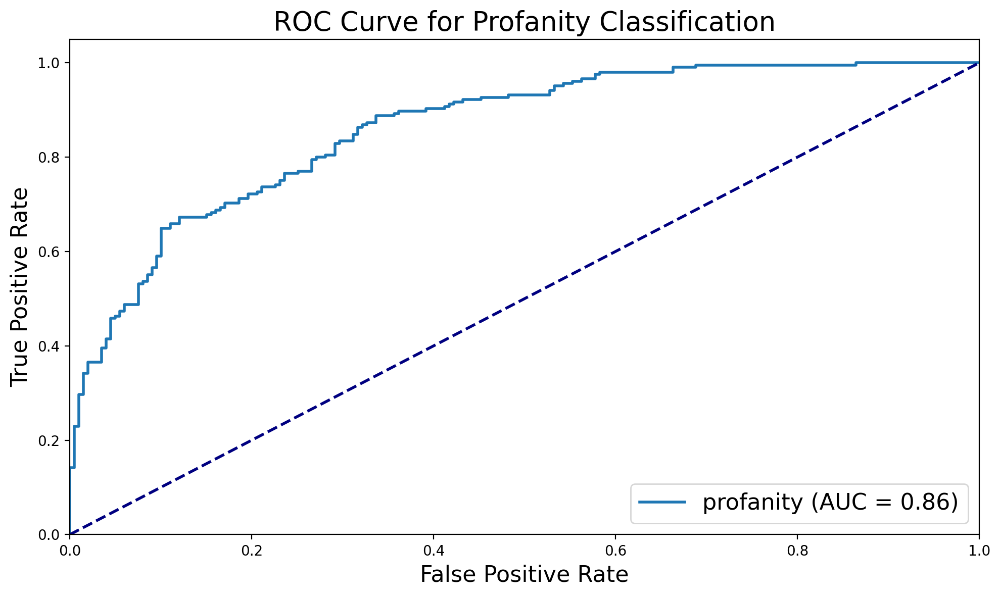

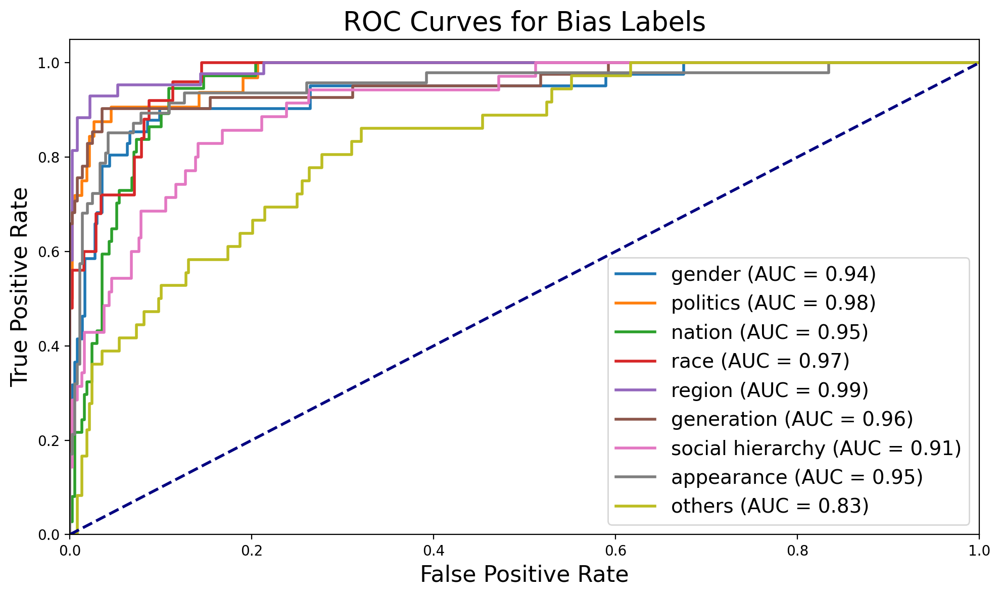

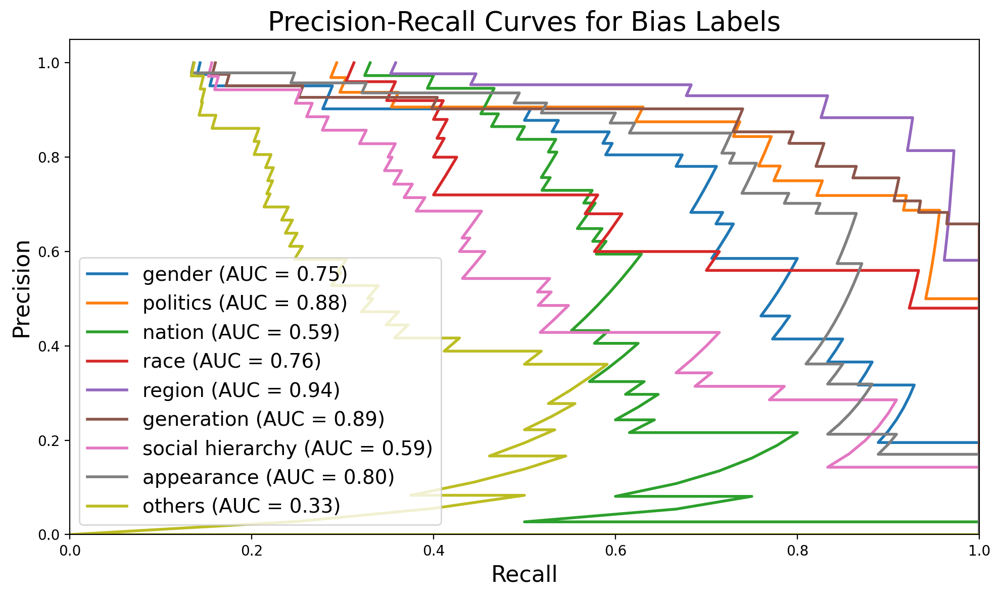


Eval results for Preference.
accuracy : 54.46
f1-macro : 52.9
preference_mae:0.6089108910891089
preference_top2_accuracy:0.8217821717262268
preference_top2_f1:0.5598353696286056

Eval results for Slang.
accuracy : 76.98
precision : 85.44
recall : 65.85
f1 : 74.38
matthews_corrcoef : 55.63
pr_auc : 0.8659590723370358
roc_auc : 0.8611594558156637

Eval results for Gender.
accuracy : 92.08
precision : 57.38
recall : 85.37
f1 : 68.63
matthews_corrcoef : 65.96
pr_auc : 0.7530351503993645
roc_auc : 0.9375797890210307

Eval results for Politic.
accuracy : 92.82
precision : 52.73
recall : 90.62
f1 : 66.67
matthews_corrcoef : 65.86
pr_auc : 0.8767283951794156
roc_auc : 0.9778225806451613

Eval results for Nation.
accuracy : 90.1
precision : 47.76
recall : 86.49
f1 : 61.54
matthews_corrcoef : 59.67
pr_auc : 0.5924965638402999
roc_auc : 0.9539730466160984

Eval results for Race.
accuracy : 90.35
precision : 38.33
recall : 92.0
f1 : 54.12
matthews_corrcoef : 55.72
pr_auc : 0.7612086280718177
roc_

epoch: 9, train loss: 7.1237: 100%|██████████████████████████████████████| 3836/3836 [24:35<00:00,  2.60it/s]


Preference Accuracy per class
Class 1: 68.33%
Class 2: 40.18%
Class 3: 75.26%
Class 4: 27.71%
Class 5: 39.09%


epoch: 9, valid loss: 11.7556: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 12.73it/s]


Preference Accuracy per class
Class 1: 79.27%
Class 2: 55.13%
Class 3: 66.34%
Class 4: 28.99%
Class 5: 52.70%


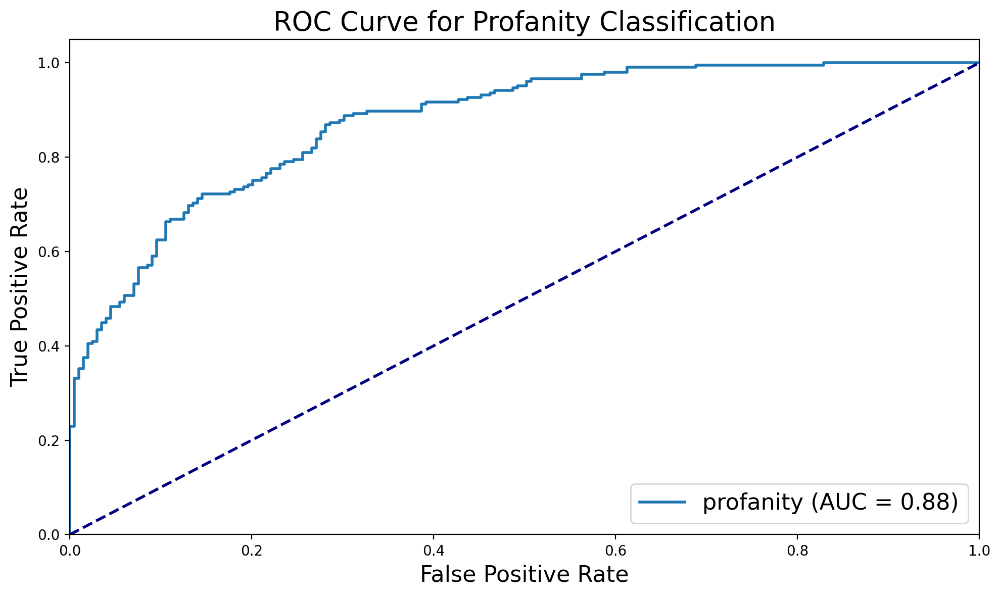

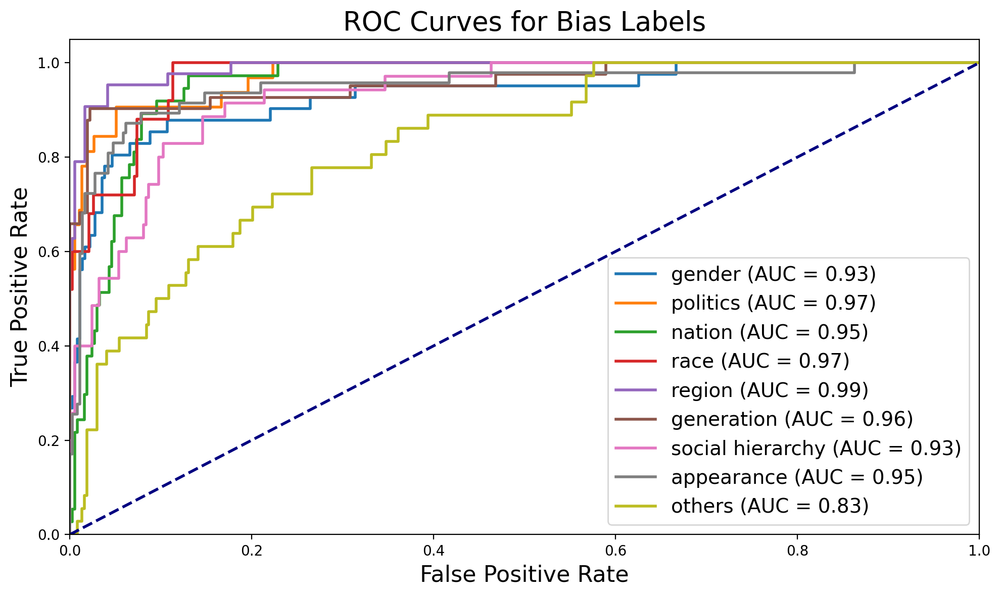

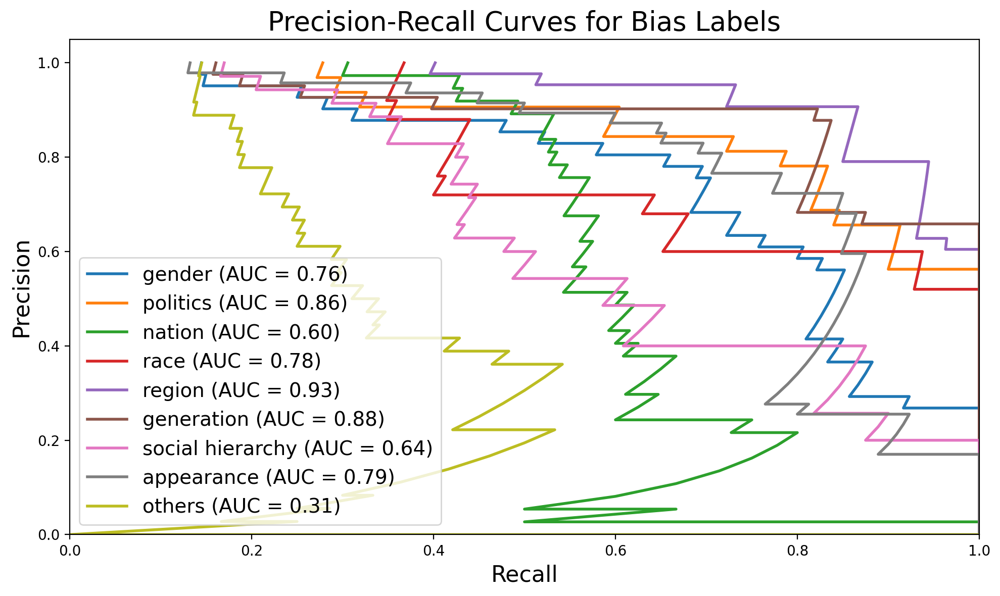


Eval results for Preference.
accuracy : 57.92
f1-macro : 56.35
preference_mae:0.5618811881188119
preference_top2_accuracy:0.8391088843345642
preference_top2_f1:0.571882031501125

Eval results for Slang.
accuracy : 77.23
precision : 84.66
recall : 67.32
f1 : 75.0
matthews_corrcoef : 55.8
pr_auc : 0.8827136296497373
roc_auc : 0.8758181149650692

Eval results for Gender.
accuracy : 92.08
precision : 57.89
recall : 80.49
f1 : 67.35
matthews_corrcoef : 64.08
pr_auc : 0.7610820954391404
roc_auc : 0.9328092454478264

Eval results for Politic.
accuracy : 94.55
precision : 60.42
recall : 90.62
f1 : 72.5
matthews_corrcoef : 71.38
pr_auc : 0.8634542496122865
roc_auc : 0.9749663978494624

Eval results for Nation.
accuracy : 91.58
precision : 52.46
recall : 86.49
f1 : 65.31
matthews_corrcoef : 63.31
pr_auc : 0.595899295672013
roc_auc : 0.9547094778702409

Eval results for Race.
accuracy : 91.83
precision : 41.67
recall : 80.0
f1 : 54.79
matthews_corrcoef : 54.07
pr_auc : 0.7831927653790034
roc_auc

epoch: 10, train loss: 7.0461: 100%|█████████████████████████████████████| 3836/3836 [24:49<00:00,  2.58it/s]


Preference Accuracy per class
Class 1: 67.10%
Class 2: 42.95%
Class 3: 75.18%
Class 4: 31.68%
Class 5: 44.00%


epoch: 10, valid loss: 10.8126: 100%|██████████████████████████████████████| 101/101 [00:07<00:00, 12.73it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 52.56%
Class 3: 55.45%
Class 4: 36.23%
Class 5: 56.76%


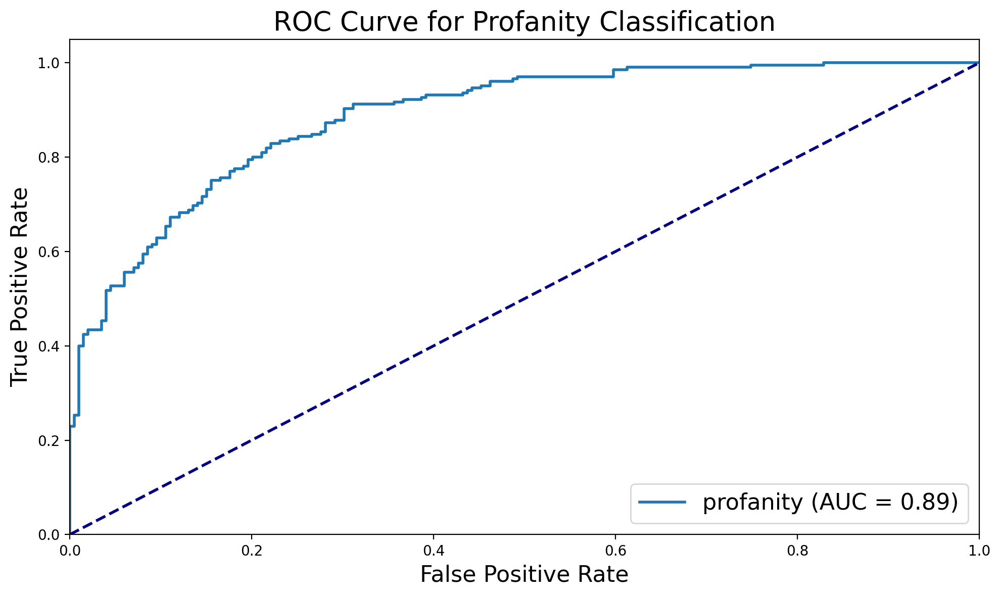

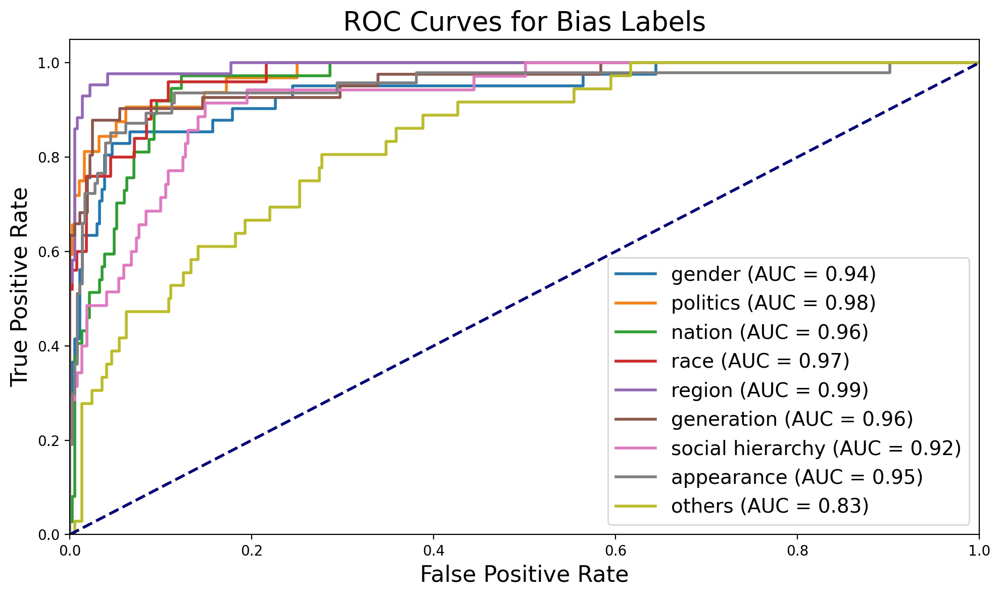

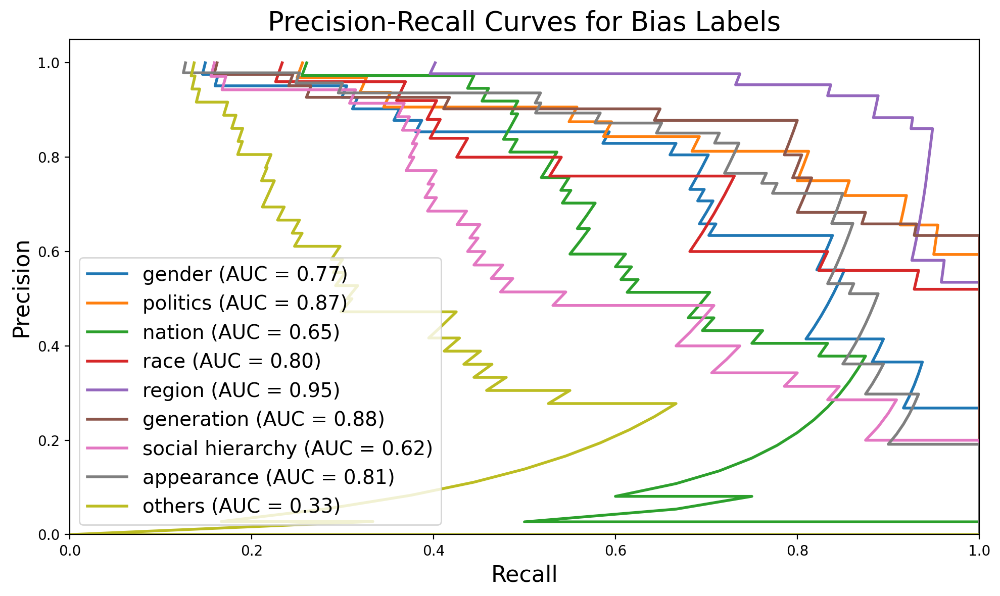


Eval results for Preference.
accuracy : 58.17
f1-macro : 57.01
preference_mae:0.5668316831683168
preference_top2_accuracy:0.8267326951026917
preference_top2_f1:0.5608970173441915

Eval results for Slang.
accuracy : 79.46
precision : 80.5
recall : 78.54
f1 : 79.51
matthews_corrcoef : 58.93
pr_auc : 0.892118323831266
roc_auc : 0.8868733913469788

Eval results for Gender.
accuracy : 92.33
precision : 58.33
recall : 85.37
f1 : 69.31
matthews_corrcoef : 66.64
pr_auc : 0.7749557301767848
roc_auc : 0.938856413357522

Eval results for Politic.
accuracy : 93.07
precision : 53.7
recall : 90.62
f1 : 67.44
matthews_corrcoef : 66.59
pr_auc : 0.8738383974969441
roc_auc : 0.9758064516129032

Eval results for Nation.
accuracy : 90.59
precision : 49.25
recall : 89.19
f1 : 63.46
matthews_corrcoef : 61.98
pr_auc : 0.6478853603110375
roc_auc : 0.9564769128801827

Eval results for Race.
accuracy : 91.34
precision : 40.38
recall : 84.0
f1 : 54.55
matthews_corrcoef : 54.55
pr_auc : 0.797986832559342
roc_auc

epoch: 11, train loss: 6.7639: 100%|█████████████████████████████████████| 3836/3836 [24:40<00:00,  2.59it/s]


Preference Accuracy per class
Class 1: 69.67%
Class 2: 44.02%
Class 3: 75.30%
Class 4: 34.33%
Class 5: 46.18%


epoch: 11, valid loss: 11.8987: 100%|██████████████████████████████████████| 101/101 [00:07<00:00, 12.99it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 57.69%
Class 3: 61.39%
Class 4: 39.13%
Class 5: 54.05%


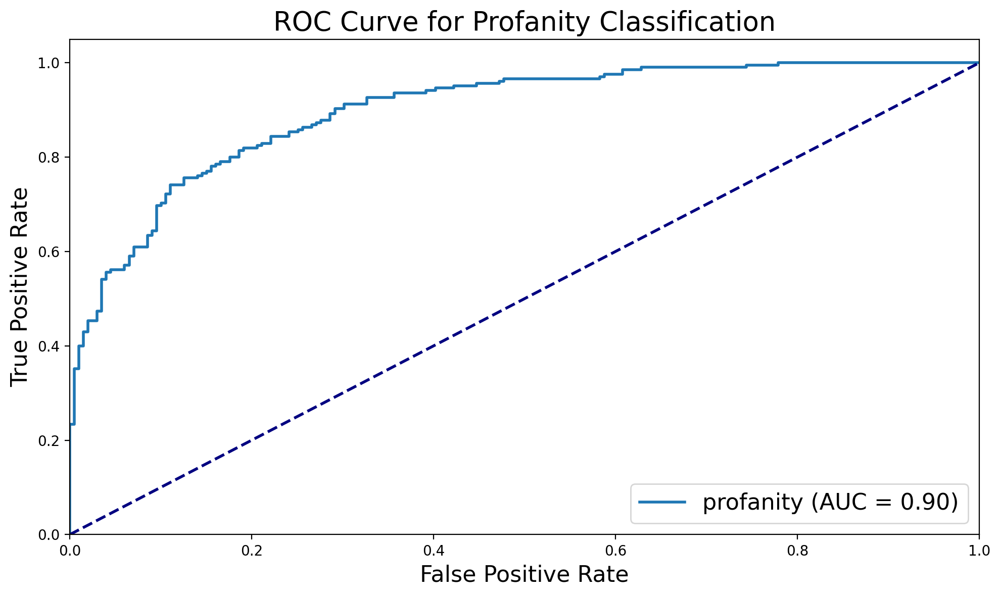

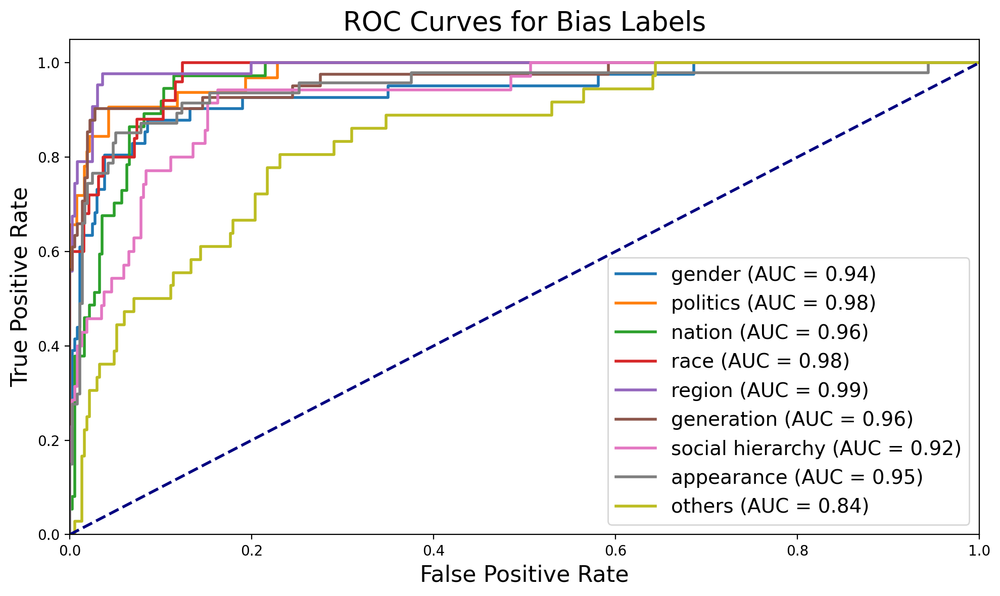

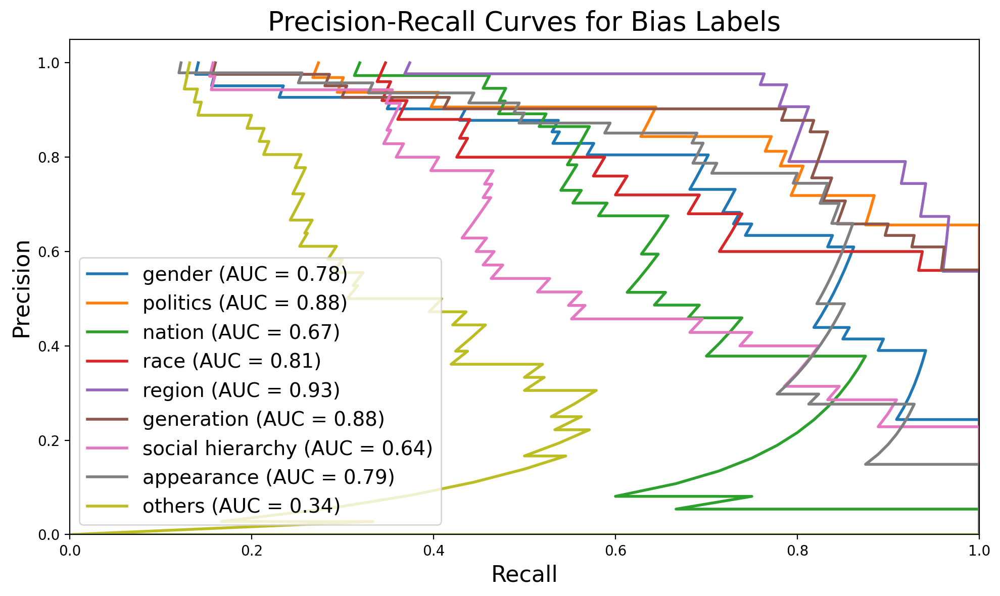


Eval results for Preference.
accuracy : 59.41
f1-macro : 58.47
preference_mae:0.5371287128712872
preference_top2_accuracy:0.8366336822509766
preference_top2_f1:0.5681388762708066

Eval results for Slang.
accuracy : 81.19
precision : 86.86
recall : 74.15
f1 : 80.0
matthews_corrcoef : 63.15
pr_auc : 0.9046909881011818
roc_auc : 0.8985169751194999

Eval results for Gender.
accuracy : 93.32
precision : 63.46
recall : 80.49
f1 : 70.97
matthews_corrcoef : 67.86
pr_auc : 0.7805353308733387
roc_auc : 0.9383860780756569

Eval results for Politic.
accuracy : 94.8
precision : 61.7
recall : 90.62
f1 : 73.42
matthews_corrcoef : 72.26
pr_auc : 0.8798126911626334
roc_auc : 0.9776545698924731

Eval results for Nation.
accuracy : 92.33
precision : 55.17
recall : 86.49
f1 : 67.37
matthews_corrcoef : 65.32
pr_auc : 0.6718867079141706
roc_auc : 0.9619265041608367

Eval results for Race.
accuracy : 91.58
precision : 41.51
recall : 88.0
f1 : 56.41
matthews_corrcoef : 56.97
pr_auc : 0.8074540139567674
roc_a

epoch: 12, train loss: 6.7511: 100%|█████████████████████████████████████| 3836/3836 [24:42<00:00,  2.59it/s]


Preference Accuracy per class
Class 1: 68.88%
Class 2: 45.02%
Class 3: 74.94%
Class 4: 37.96%
Class 5: 47.09%


epoch: 12, valid loss: 11.6655: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 12.32it/s]


Preference Accuracy per class
Class 1: 79.27%
Class 2: 57.69%
Class 3: 58.42%
Class 4: 44.93%
Class 5: 51.35%


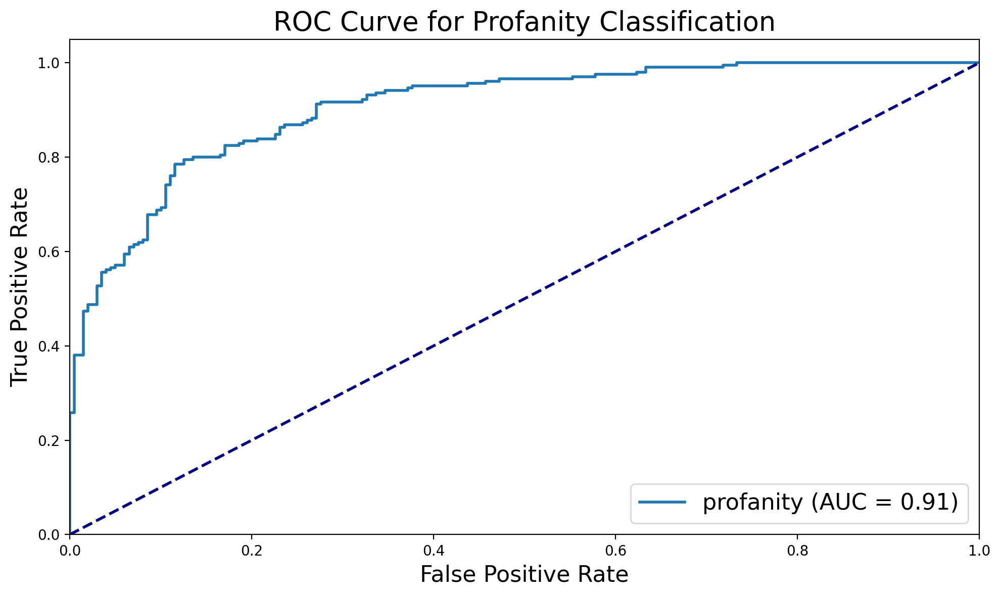

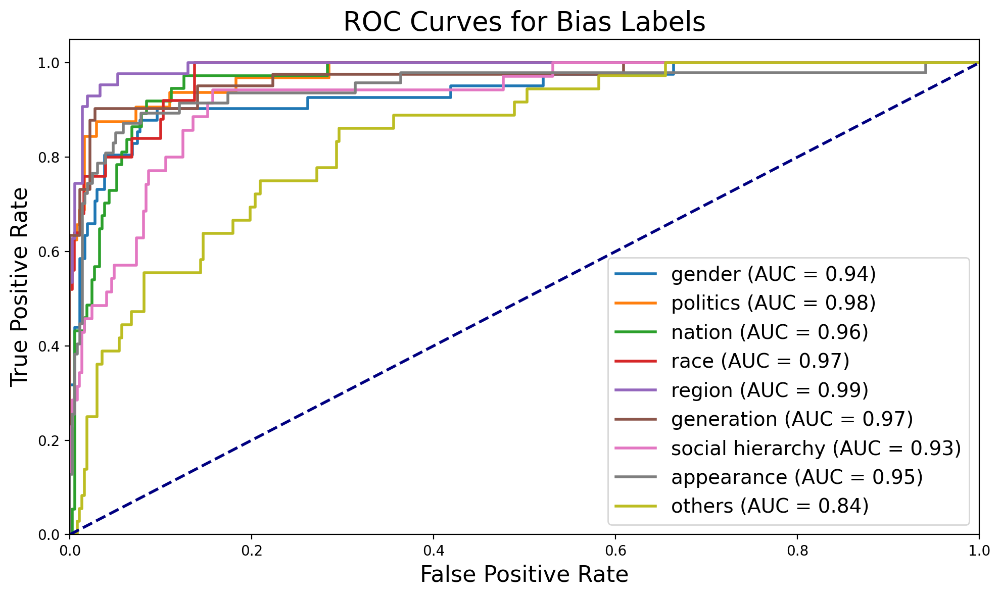

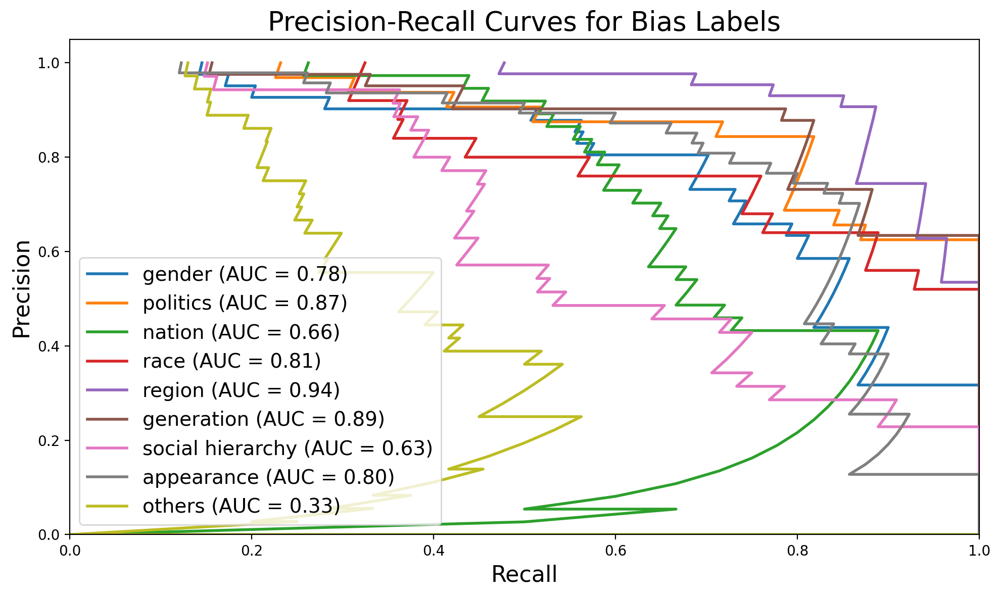


Eval results for Preference.
accuracy : 58.91
f1-macro : 58.32
preference_mae:0.5396039603960396
preference_top2_accuracy:0.8341584205627441
preference_top2_f1:0.5666589917005939

Eval results for Slang.
accuracy : 82.92
precision : 85.79
recall : 79.51
f1 : 82.53
matthews_corrcoef : 66.05
pr_auc : 0.9122268138966103
roc_auc : 0.9062139968133349

Eval results for Gender.
accuracy : 94.31
precision : 69.57
recall : 78.05
f1 : 73.56
matthews_corrcoef : 70.53
pr_auc : 0.7840576294426694
roc_auc : 0.9383188873211047

Eval results for Politic.
accuracy : 95.54
precision : 66.67
recall : 87.5
f1 : 75.68
matthews_corrcoef : 74.09
pr_auc : 0.8723185077091201
roc_auc : 0.9756384408602151

Eval results for Nation.
accuracy : 91.58
precision : 52.46
recall : 86.49
f1 : 65.31
matthews_corrcoef : 63.31
pr_auc : 0.6560127709541242
roc_auc : 0.9625892922895648

Eval results for Race.
accuracy : 92.33
precision : 43.48
recall : 80.0
f1 : 56.34
matthews_corrcoef : 55.48
pr_auc : 0.8130649702228568
roc

epoch: 13, train loss: 6.0424: 100%|█████████████████████████████████████| 3836/3836 [24:52<00:00,  2.57it/s]


Preference Accuracy per class
Class 1: 67.54%
Class 2: 46.98%
Class 3: 74.81%
Class 4: 37.79%
Class 5: 48.18%


epoch: 13, valid loss: 11.4816: 100%|██████████████████████████████████████| 101/101 [00:07<00:00, 13.13it/s]


Preference Accuracy per class
Class 1: 73.17%
Class 2: 58.97%
Class 3: 60.40%
Class 4: 43.48%
Class 5: 56.76%


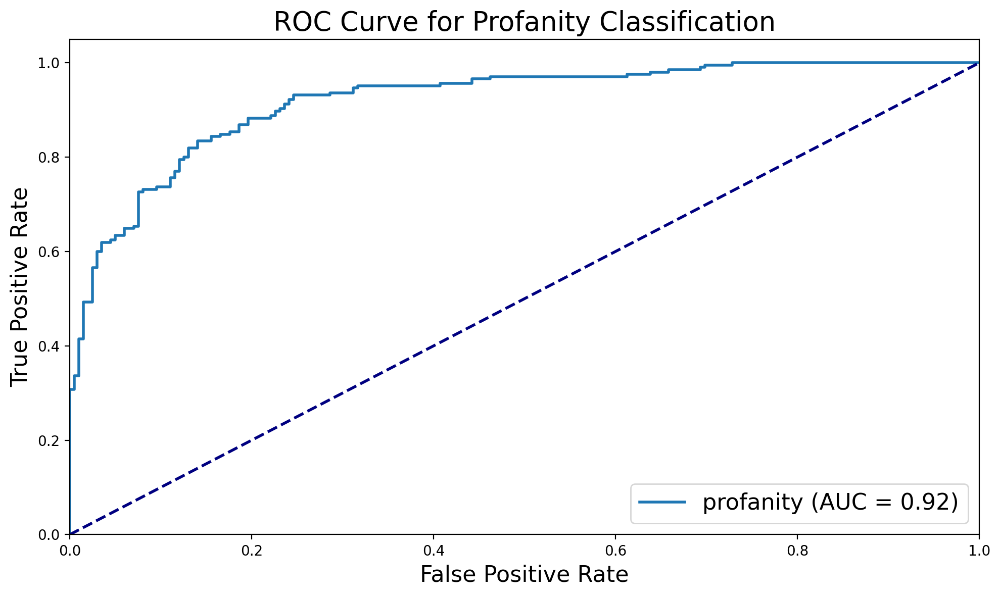

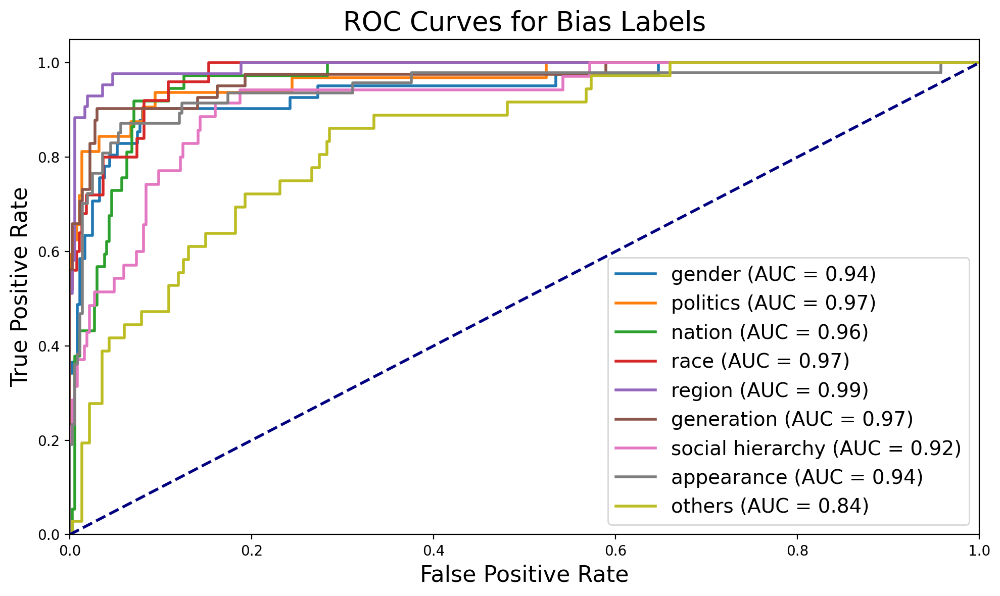

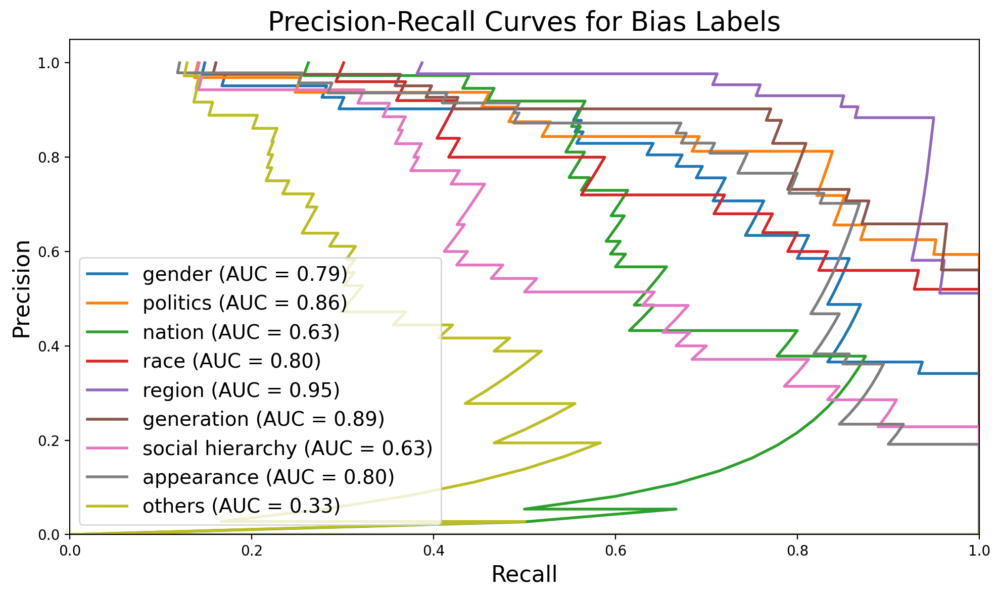


Eval results for Preference.
accuracy : 59.16
f1-macro : 58.87
preference_mae:0.5247524752475248
preference_top2_accuracy:0.8514851331710815
preference_top2_f1:0.5784675047174067

Eval results for Slang.
accuracy : 83.66
precision : 87.17
recall : 79.51
f1 : 83.16
matthews_corrcoef : 67.63
pr_auc : 0.9252748660547847
roc_auc : 0.9195734771418066

Eval results for Gender.
accuracy : 93.32
precision : 63.46
recall : 80.49
f1 : 70.97
matthews_corrcoef : 67.86
pr_auc : 0.7916199696213448
roc_auc : 0.9432910031579654

Eval results for Politic.
accuracy : 96.04
precision : 72.22
recall : 81.25
f1 : 76.47
matthews_corrcoef : 74.47
pr_auc : 0.8610351714591392
roc_auc : 0.9651377688172043

Eval results for Nation.
accuracy : 92.57
precision : 55.93
recall : 89.19
f1 : 68.75
matthews_corrcoef : 67.06
pr_auc : 0.6347445166129826
roc_auc : 0.9601590691508948

Eval results for Race.
accuracy : 92.33
precision : 43.48
recall : 80.0
f1 : 56.34
matthews_corrcoef : 55.48
pr_auc : 0.804022987488082
roc

epoch: 14, train loss: 5.9674: 100%|█████████████████████████████████████| 3836/3836 [24:49<00:00,  2.58it/s]


Preference Accuracy per class
Class 1: 68.85%
Class 2: 47.82%
Class 3: 74.49%
Class 4: 40.32%
Class 5: 50.73%


epoch: 14, valid loss: 11.1448: 100%|██████████████████████████████████████| 101/101 [00:07<00:00, 12.84it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 55.13%
Class 3: 56.44%
Class 4: 50.72%
Class 5: 60.81%


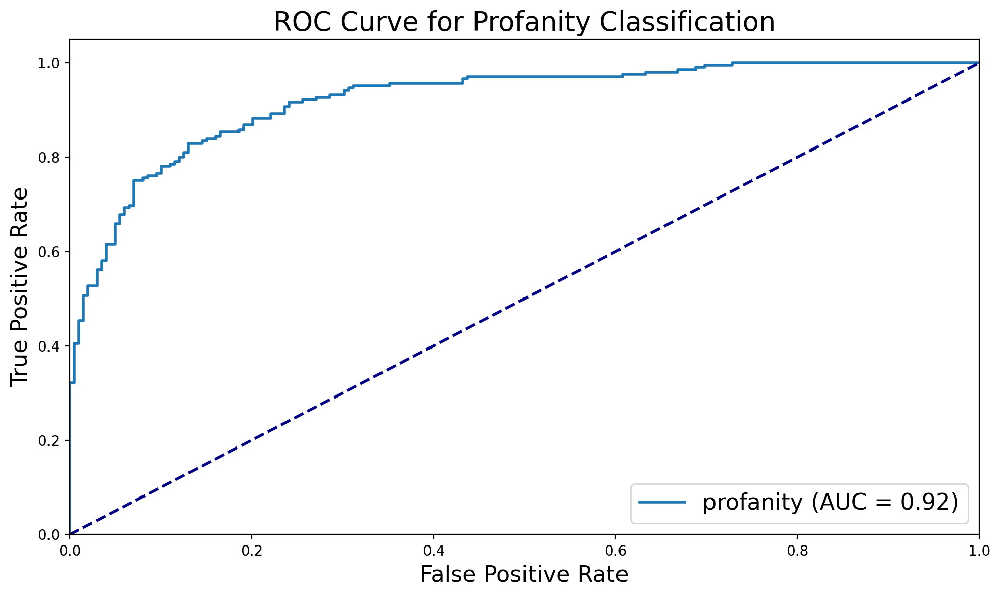

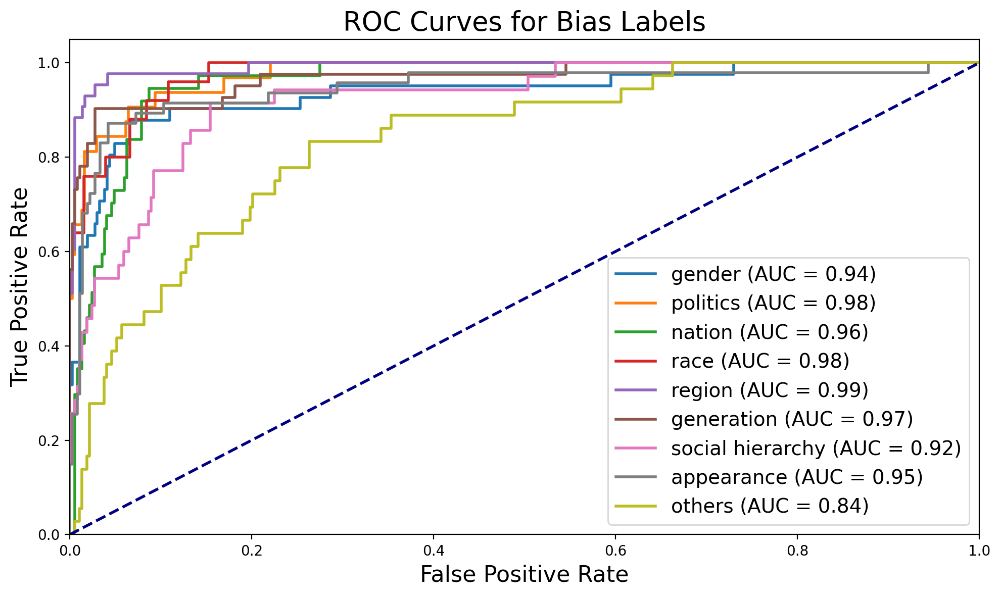

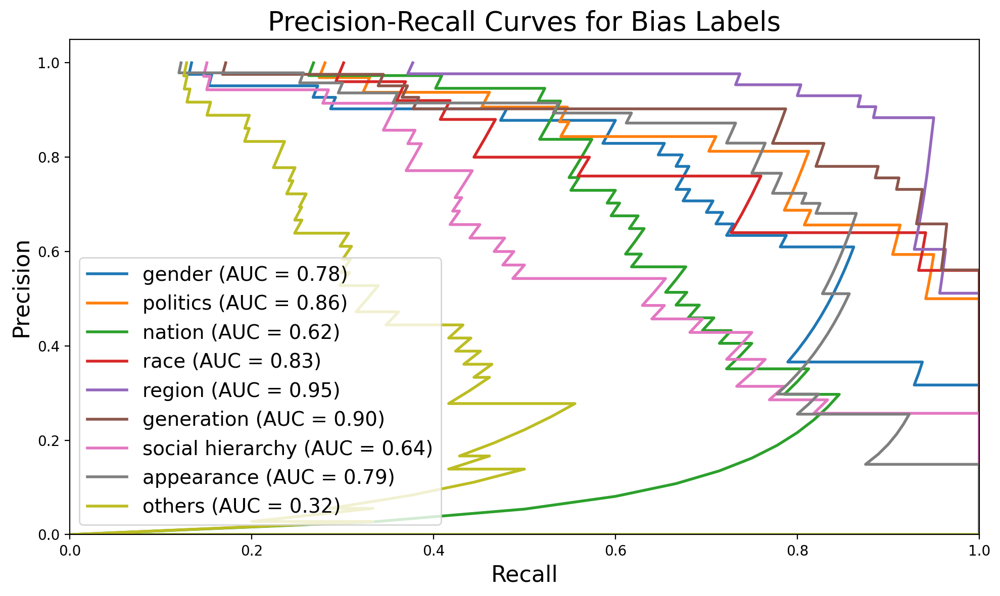


Eval results for Preference.
accuracy : 61.63
f1-macro : 61.23
preference_mae:0.49504950495049505
preference_top2_accuracy:0.8465346693992615
preference_top2_f1:0.5749426347071205

Eval results for Slang.
accuracy : 84.65
precision : 86.29
recall : 82.93
f1 : 84.58
matthews_corrcoef : 69.37
pr_auc : 0.929215166827162
roc_auc : 0.922588552518691

Eval results for Gender.
accuracy : 93.32
precision : 62.96
recall : 82.93
f1 : 71.58
matthews_corrcoef : 68.7
pr_auc : 0.7794995535150029
roc_auc : 0.9378485520392394

Eval results for Politic.
accuracy : 95.54
precision : 67.5
recall : 84.38
f1 : 75.0
matthews_corrcoef : 73.13
pr_auc : 0.8600089107468482
roc_auc : 0.9769825268817204

Eval results for Nation.
accuracy : 91.34
precision : 51.67
recall : 83.78
f1 : 63.92
matthews_corrcoef : 61.55
pr_auc : 0.6243408146367408
roc_auc : 0.9600854260254805

Eval results for Race.
accuracy : 92.82
precision : 45.83
recall : 88.0
f1 : 60.27
matthews_corrcoef : 60.42
pr_auc : 0.8263790254322905
roc_au

epoch: 15, train loss: 5.9192:  32%|███████████▋                         | 1211/3836 [07:54<17:15,  2.53it/s]

In [ ]:
train_losses = []
val_f1 = []
val_roc_auc= []
val_accuracy = []
val_mae = []
val_top2_acc = []
val_top2_f1 = []
val_pr_auc = []
best_avg_score = 0

if config.do_train:
    best_score = [0] * 11
    # Start training over a number of epochs
    for epoch in range(config.num_train_epochs):
        train_results = run_epoch(loader=train_dataloader, epoch=epoch, is_train=True, **params)
        train_loss = train_results['loss']
        train_losses.append(train_loss)
        
        # Optionally evaluate model during training
        if config.do_eval_during_train:
            eval_results = do_eval(epoch)
            
            # Store evaluation metrics
            val_f1.append(tuple(eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)))
            val_roc_auc.append(tuple(eval_results[i]["roc_auc"] for i in range(1, 11)))
            val_accuracy.append(tuple(eval_results[i]["accuracy"] for i in range(11)))
            val_mae.append(eval_results[11])
            val_top2_acc.append(eval_results[12])
            val_top2_f1.append(eval_results[13])
            val_pr_auc.append(tuple(eval_results[-10:]))
            
            # Check and store best model based on average F1 score
            current_score = [eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)]
            current_avg_score = sum(current_score) / len(current_score)  
            if current_avg_score >= best_avg_score:
                best_avg_score = current_avg_score
                output_dir = os.path.join(config.output_dir, config.task, config.dataset, f"{epoch}-best-ckpt")
                # Save best model
                copy.deepcopy(
                    model_dp.module if hasattr(model_dp, "module") else model_dp._models[0] if hasattr(model_dp, "_models") else model_dp
                ).cpu().save_pretrained(output_dir)
                # Save configuration of best model
                with open(os.path.join(output_dir, "finetune_config.json"), "w") as save_config:
                    json.dump(vars(config), save_config, sort_keys=True, indent=4)
                print(f"Checkpoint {output_dir} saved.")             

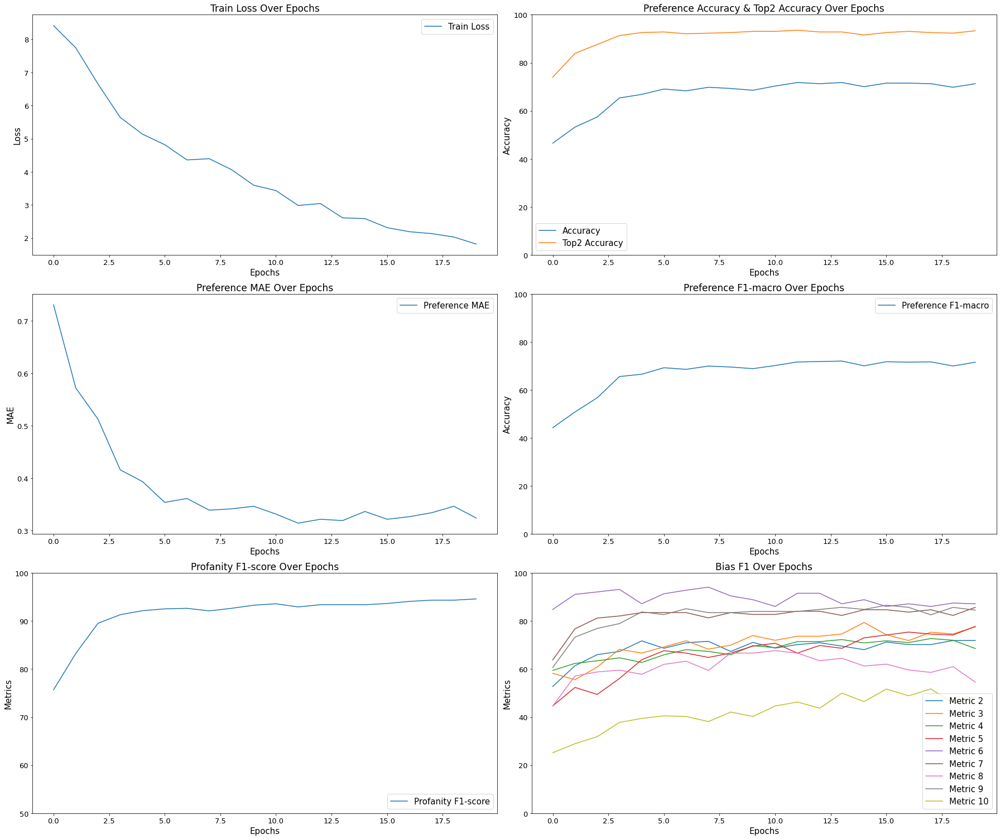

In [22]:
import numpy as npii
import matplotlib.pyplot as plt

# Create a 3x2 grid for the subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(25, 21))

# 1. Train Loss Over Epochs
axs[0, 0].plot(train_losses, label='Train Loss')
axs[0, 0].set_xlabel('Epochs', fontsize=15)
axs[0, 0].set_ylabel('Loss', fontsize=15)
axs[0, 0].set_title('Train Loss Over Epochs', fontsize=17)
axs[0, 0].legend(fontsize=15)
axs[0, 0].tick_params(axis='both', labelsize=13)
axs[0, 0].grid(False)

# 2. Preference Accuracy & Top2 Accuracy Over Epochs
val_accuracy = np.array(val_accuracy)
val_top2_accuracy = np.array(val_top2_acc) * 100
axs[0, 1].plot(val_accuracy[:, 0], label='Accuracy', linestyle='-')
axs[0, 1].plot(val_top2_accuracy, label='Top2 Accuracy', linestyle='-')
axs[0, 1].set_xlabel('Epochs', fontsize=15)
axs[0, 1].set_ylabel('Accuracy', fontsize=15)
axs[0, 1].set_ylim(0, 100)
axs[0, 1].set_title('Preference Accuracy & Top2 Accuracy Over Epochs', fontsize=17)
axs[0, 1].legend(fontsize=15)
axs[0, 1].tick_params(axis='both', labelsize=13)
axs[0, 1].grid(False)

# 3. Preference MAE Over Epochs
val_mae = np.array(val_mae)
axs[1, 0].plot(val_mae, label='Preference MAE', linestyle='-')
axs[1, 0].set_xlabel('Epochs', fontsize=15)
axs[1, 0].set_ylabel('MAE', fontsize=15)
axs[1, 0].set_title('Preference MAE Over Epochs', fontsize=17)
axs[1, 0].legend(fontsize=15)
axs[1, 0].tick_params(axis='both', labelsize=13)
axs[1, 0].grid(False)

# 4. Preference F1-macro Over Epochs
result = [val_f1[i][0] for i in range(config.num_train_epochs)]
axs[1, 1].plot(result, label='Preference F1-macro', linestyle='-')
axs[1, 1].set_xlabel('Epochs', fontsize=15)
axs[1, 1].set_ylabel('Accuracy', fontsize=15)
axs[1, 1].set_ylim(0, 100)
axs[1, 1].set_title('Preference F1-macro Over Epochs', fontsize=17)
axs[1, 1].legend(fontsize=15)
axs[1, 1].tick_params(axis='both', labelsize=13)
axs[1, 1].grid(False)

# 5. Profanity Metrics Over Epochs
result = [val_f1[i][1] for i in range(config.num_train_epochs)]
axs[2, 0].plot(result, label='Profanity F1-score', linestyle='-')
axs[2, 0].set_xlabel('Epochs', fontsize=15)
axs[2, 0].set_ylabel('Metrics', fontsize=15)
axs[2, 0].set_ylim(50, 100)
axs[2, 0].set_title('Profanity F1-score Over Epochs', fontsize=17)
axs[2, 0].legend(loc="lower right", fontsize=15)
axs[2, 0].tick_params(axis='both', labelsize=13)
axs[2, 0].grid(False)

# 6. Bias F1-score Over Epochs
for j in range(2, 11):
    result = [val_f1[i][j] for i in range(config.num_train_epochs)]
    axs[2, 1].plot(result, label=f'Metric {j}', linestyle='-')
    axs[2, 1].set_xlabel('Epochs', fontsize=15)
    axs[2, 1].set_ylabel('Metrics', fontsize=15)
    axs[2, 1].set_ylim(0, 100)
    axs[2, 1].set_title('Bias F1 Over Epochs', fontsize=17)
    axs[2, 1].legend(loc="lower right", fontsize=15)
    axs[2, 1].tick_params(axis='both', labelsize=13)
    axs[2, 1].grid(False)

plt.tight_layout()
#plt.savefig('combined_plots.pdf', format='pdf')
plt.show()